<a href="https://www.kaggle.com/code/christopherkrim/fork-of-fork-of-icr-submission-cvs?scriptVersionId=235528112" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# To scale the data using z-score 
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

# Algorithms to use
from sklearn.linear_model import LogisticRegression

from sklearn.svm import SVC

from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import BaggingClassifier

from sklearn.ensemble import RandomForestClassifier

# Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve,recall_score
from sklearn import tree


# For tuning the model
from sklearn.model_selection import GridSearchCV

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/traincsv/train.csv


In [3]:
import pandas as pd
data = pd.read_csv('/kaggle/input/traincsv/train.csv') 
print(data)

               Id        AB          AF          AH          AM         AR  \
0    000ff2bfdfe9  0.209377  3109.03329   85.200147   22.394407   8.138688   
1    007255e47698  0.145282   978.76416   85.200147   36.968889   8.138688   
2    013f2bd269f5  0.470030  2635.10654   85.200147   32.360553   8.138688   
3    043ac50845d5  0.252107  3819.65177  120.201618   77.112203   8.138688   
4    044fb8a146ec  0.380297  3733.04844   85.200147   14.103738   8.138688   
..            ...       ...         ...         ...         ...        ...   
612  fd3dafe738fd  0.149555  3130.05946  123.763599    9.513984  13.020852   
613  fd895603f071  0.435846  5462.03438   85.200147   46.551007  15.973224   
614  fd8ef6377f76  0.427300  2459.10720  130.138587   55.355778  10.005552   
615  fe1942975e40  0.363205  1263.53524   85.200147   23.685856   8.138688   
616  ffcca4ded3bb  0.482849  2672.53426  546.663930  112.006102   8.138688   

           AX        AY         AZ          BC  ...         FL 

In [4]:
data.head()

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,...,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class
0,000ff2bfdfe9,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,...,7.298162,1.73855,0.094822,11.339138,72.611063,2003.810319,22.136229,69.834944,0.120343,1
1,007255e47698,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,...,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000,0
2,013f2bd269f5,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,...,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941,0
3,043ac50845d5,0.252107,3819.65177,120.201618,77.112203,8.138688,3.685344,0.025578,11.053708,1.229900,...,6.122162,0.49706,0.284466,18.529584,82.416803,2094.262452,39.948656,90.493248,0.155829,0
4,044fb8a146ec,0.380297,3733.04844,85.200147,14.103738,8.138688,3.942255,0.054810,3.396778,102.151980,...,8.153058,48.50134,0.121914,16.408728,146.109943,8524.370502,45.381316,36.262628,0.096614,1


In [5]:
data.tail()

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,...,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class
612,fd3dafe738fd,0.149555,3130.05946,123.763599,9.513984,13.020852,3.499305,0.077343,8.545512,2.804172,...,0.173229,1.26092,0.067730,8.967128,217.148554,8095.932828,24.640462,69.191944,21.978000,0
613,fd895603f071,0.435846,5462.03438,85.200147,46.551007,15.973224,5.979825,0.025882,12.622906,3.777550,...,10.223150,1.24236,0.426699,35.896418,496.994214,3085.308063,29.648928,124.808872,0.145340,0
614,fd8ef6377f76,0.427300,2459.10720,130.138587,55.355778,10.005552,8.070549,0.025578,15.408390,1.229900,...,0.173229,0.49706,0.067730,19.962092,128.896894,6474.652866,26.166072,119.559420,21.978000,0
615,fe1942975e40,0.363205,1263.53524,85.200147,23.685856,8.138688,7.981959,0.025578,7.524588,1.229900,...,9.256996,0.78764,0.670527,24.594488,72.611063,1965.343176,25.116750,37.155112,0.184622,0
616,ffcca4ded3bb,0.482849,2672.53426,546.663930,112.006102,8.138688,3.198099,0.116928,3.396778,7.948668,...,0.173229,1.14492,0.149006,13.673940,72.611063,6850.484442,45.745974,114.842372,21.978000,0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 617 entries, 0 to 616
Data columns (total 58 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Id      617 non-null    object 
 1   AB      617 non-null    float64
 2   AF      617 non-null    float64
 3   AH      617 non-null    float64
 4   AM      617 non-null    float64
 5   AR      617 non-null    float64
 6   AX      617 non-null    float64
 7   AY      617 non-null    float64
 8   AZ      617 non-null    float64
 9   BC      617 non-null    float64
 10  BD      617 non-null    float64
 11  BN      617 non-null    float64
 12  BP      617 non-null    float64
 13  BQ      557 non-null    float64
 14  BR      617 non-null    float64
 15  BZ      617 non-null    float64
 16  CB      615 non-null    float64
 17  CC      614 non-null    float64
 18  CD      617 non-null    float64
 19  CF      617 non-null    float64
 20  CH      617 non-null    float64
 21  CL      617 non-null    float64
 22  CR

Observation

Id and EJ are object

Class is an integer

They rest are all float

In [7]:
data.duplicated().sum()

0

In [8]:
data.shape

(617, 58)

In [9]:
# Checking unique values in each column
data.nunique()

Id       617
AB       217
AF       599
AH       227
AM       605
AR       130
AX       427
AY       148
AZ       484
BC       259
BD       617
BN        53
BP       612
BQ       515
BR       566
BZ       115
CB       553
CC       602
CD       584
CF       586
CH       135
CL       123
CR       595
CS       576
CU       307
CW       426
DA       611
DE       616
DF       137
DH       191
DI       571
DL       604
DN       576
DU       253
DV        39
DY       590
EB       439
EE       513
EG       610
EH       127
EJ         2
EL       311
EP       275
EU       455
FC       600
FD       337
FE       615
FI       498
FL       388
FR       435
FS       161
GB       560
GE       264
GF       611
GH       596
GI       615
GL       355
Class      2
dtype: int64

Observations:

Id Unique identifier for each observation. is an identifier and we can drop this column as it would not add any value to our analysis. Class and EJ have only 2 unique value. These columns will not add any value to our model hence we can drop them. Class and EJ have only 2 unique value. We can drop these columns as they will not add any value to our analysis. On the basis of number of unique values in each column and the data description, we can identify the continuous and categorical columns (EJ) in the data

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
AB,617.0,0.477149,0.468388,0.081187,0.252107,0.354659,0.559763,6.161666
AF,617.0,3502.013221,2300.322717,192.593280,2197.345480,3120.318960,4361.637390,28688.187660
AH,617.0,118.624513,127.838950,85.200147,85.200147,85.200147,113.739540,1910.123198
AM,617.0,38.968552,69.728226,3.177522,12.270314,20.533110,39.139886,630.518230
AR,617.0,10.128242,10.518877,8.138688,8.138688,8.138688,8.138688,178.943634
AX,617.0,5.545576,2.551696,0.699861,4.128294,5.031912,6.431634,38.270880
AY,617.0,0.060320,0.416817,0.025578,0.025578,0.025578,0.036845,10.315851
AZ,617.0,10.566447,4.350645,3.396778,8.129580,10.461320,12.969516,38.971568
BC,617.0,8.053012,65.166943,1.229900,1.229900,1.229900,5.081244,1463.693448
BD,617.0,5350.388655,3021.326641,1693.624320,4155.702870,4997.960730,6035.885700,53060.599240


In [11]:
# Dropping the columns 
data=data.drop(['EJ'],axis=1)

In [12]:
# Creating numerical columns
num_cols=['AB','AF','AH','AM','AR','AX','AY','AZ','BC','BN','BP','BQ','BR','BZ','CB','CC','CF','CH','CR','CL'
          ,'CS','CU','DA','DE','DI','DL','DN','DU','DV','DY','EB','EE','EG','EH','EL','EP','EU','FC','FE','FI','FL','FR','FS','GB','GF'
         ,'GH','GI','GL']

# Creating categorical variables 
cat_cols= ['Class','Id']

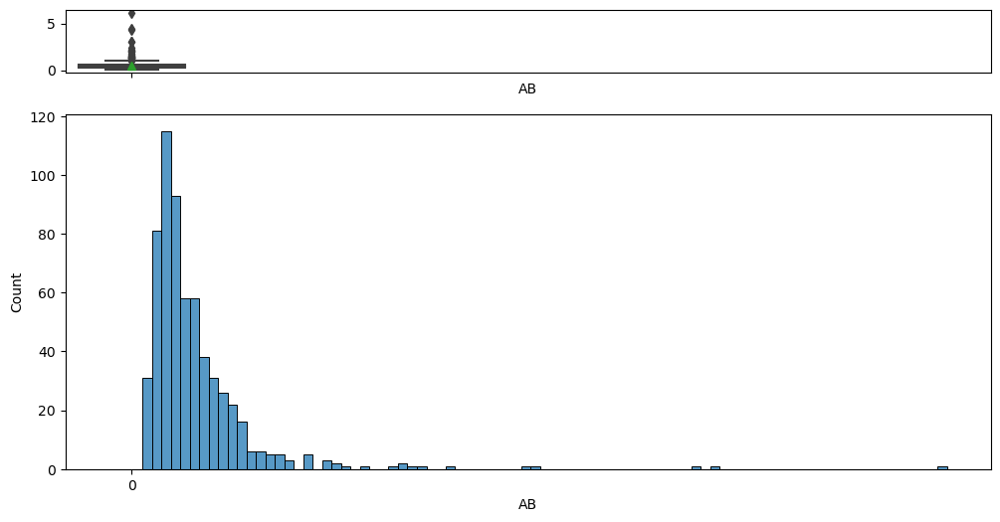

In [13]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={'height_ratios': (0.15, 0.85)}, figsize=(12,6))
sns.boxplot(data['AB'], ax=ax_box, showmeans=True)
sns.histplot(data['AB'], ax=ax_hist)
ax_box.set(xlabel='AB')
plt.show()

Observations:

The AB(anonymized health characteristics) have the highest count approximately 117 and 0.4 on the x-axis.

Few flyers on AB axis at 3,4.2,4.4 and 6.4 with the count of 2 on the count.

The health characteristics is skewed to the right implying that the change linked to the three related condition is slow

The health characteristics linked to the three aged related conditions is active at the early stage between 0 to 1

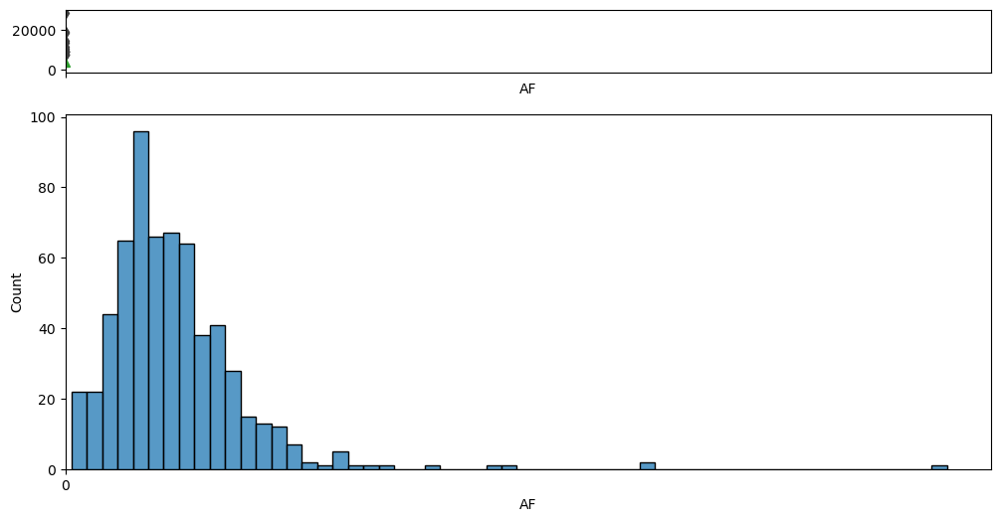

In [14]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={'height_ratios': (0.15, 0.85)}, figsize=(12,6))
sns.boxplot(data['AF'], ax=ax_box, showmeans=True)
sns.histplot(data['AF'], ax=ax_hist)
ax_box.set(xlabel='AF')
plt.show()

The Subject AF (anonymized health characteristics) have the highest progression approximately 97 and 2500 on the x-axis.

Few flyers on AB axis at 15000,20000,25000 and 30000 with the count of 4 on the count.

The subject (health characteristics) is skewed to the right implying that the change linked to the three age related condition is slow

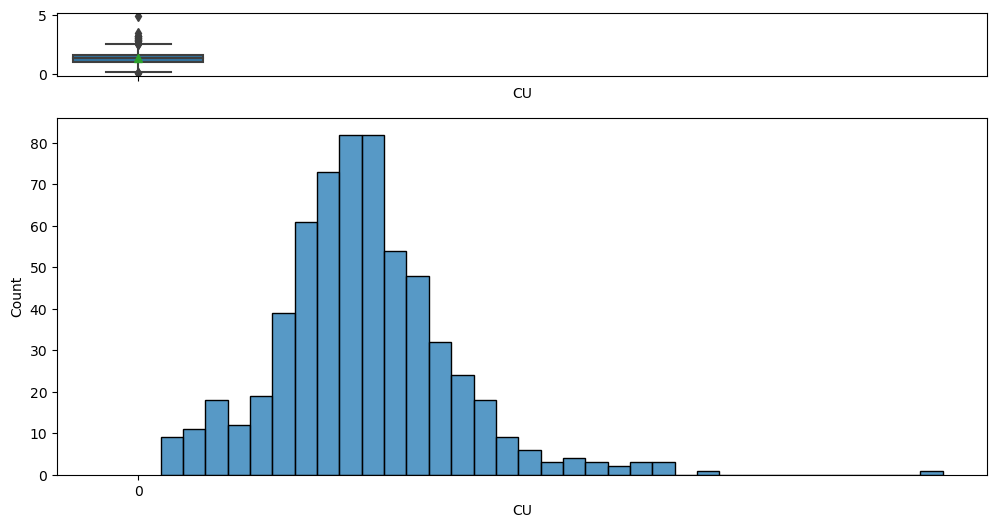

In [15]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={'height_ratios': (0.15, 0.85)}, figsize=(12,6))
sns.boxplot(data['CU'], ax=ax_box, showmeans=True)
sns.histplot(data['CU'], ax=ax_hist)
ax_box.set(xlabel='CU')
plt.show()

The change in related health characteristics is normally distributed with right skewdness, which imply slow change.

The subject CU(anonymized health characteristics) have the highest count approximately 117 and 0.4 on the x-axis.

Few flyers on subject AB axis at 3,4 and 4.8 with the count of 2 on the count.

The subject (health characteristics) is skewed to the right implying that the change linked to the three related condition is slow

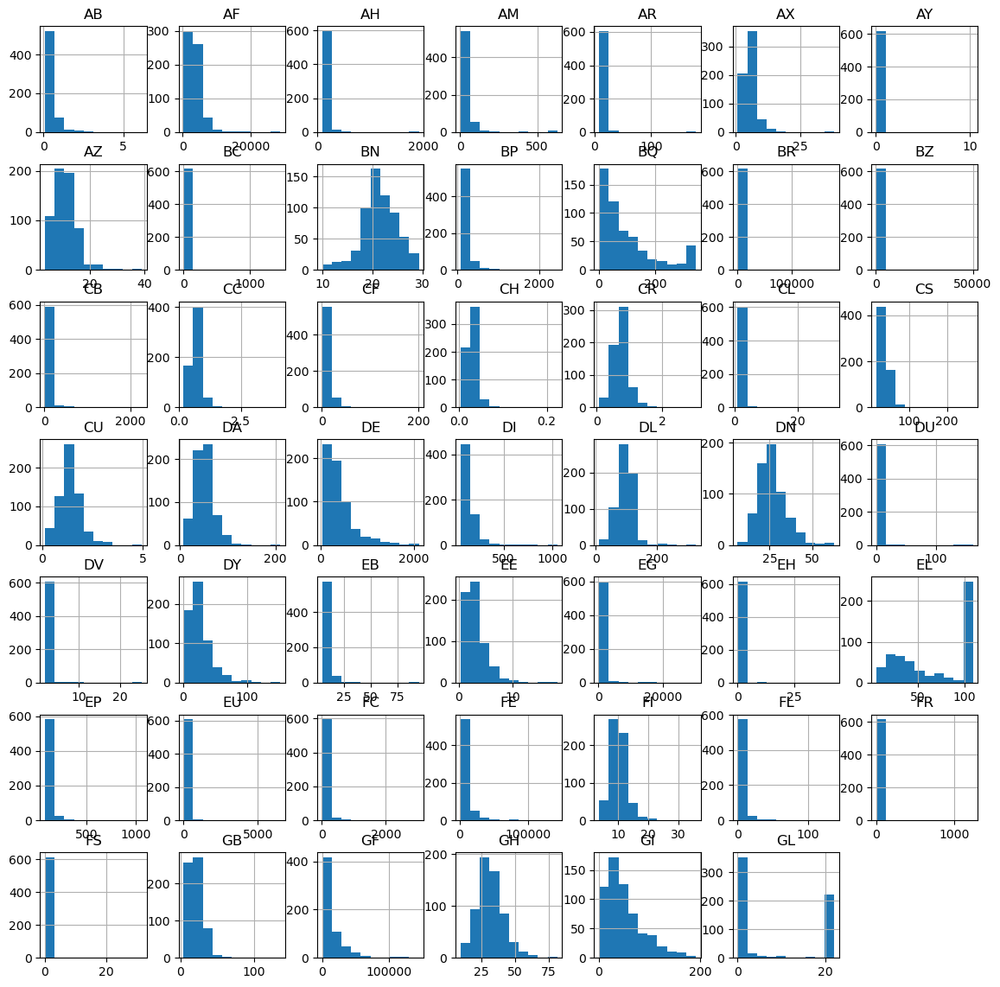

In [16]:
# Creating histograms of health characteristics linked to three age-related conditions
data[num_cols].hist(figsize=(14,14))
plt.show()

Observations of subject (health characteristics linked to three age-related conditions):

They BN,CB,CR,CU,DY,DA,DL,DN,GH,FI distribution are close to a normal distribution.

The subject (health characteristics) linked to three age-related conditions is skewed to the right, implying that they are increasesing little by little(gradually).

BQ,DE,EL,GI,EE are skewed to the right, indicating that the majority of three age-related conditions are in entry / mid-level of the age-related conditions.

BQ also has a right skewed distribution, meaning most of the three age-related conditions are in their early stage but a few have gone advanced.

All the health charateristics with the exception of BN,CB,CR,CU,DY,DA,DL,DN,GH,FI do manifest earlier in life, thus it can be treated or cured earlier.

In [17]:
# Printing the % sub categories of each category
for i in cat_cols:
    print(data[i].value_counts(normalize=True))
    print('*'*40)

0    0.824959
1    0.175041
Name: Class, dtype: float64
****************************************
000ff2bfdfe9    0.001621
a20c68851e9b    0.001621
9ee887ad93d5    0.001621
9ef1886b810c    0.001621
9f10f72ca154    0.001621
                  ...   
50183292c0e7    0.001621
508bb5c5cf00    0.001621
51111505c6f2    0.001621
514d2ac4fdb5    0.001621
ffcca4ded3bb    0.001621
Name: Id, Length: 617, dtype: float64
****************************************


Observations:

Both Class and Id are float

The lenth of Id is 617

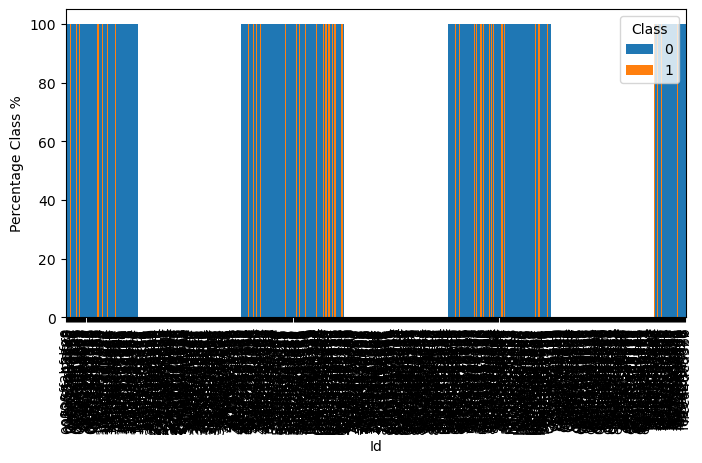

In [18]:
for i in cat_cols:
    if i!='Class':
        (pd.crosstab(data[i],data['Class'],normalize='index')*100).plot(kind='bar',figsize=(8,4),stacked=True)
        plt.ylabel('Percentage Class %')

The subject been diagnosed with one of these health characteristics linked to three age-related conditions are few

when compared to those that are not positive to three age-related conditions

Let's check the relationship between Class and Numerical variables

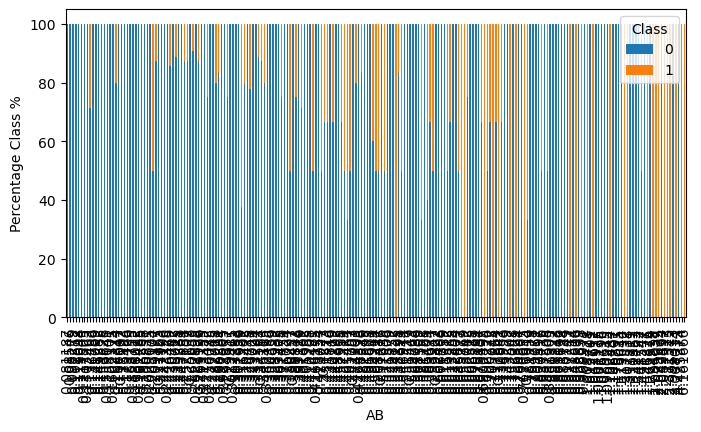

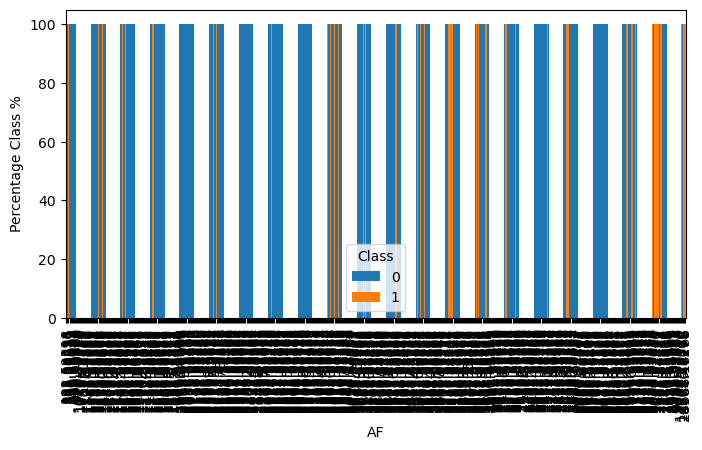

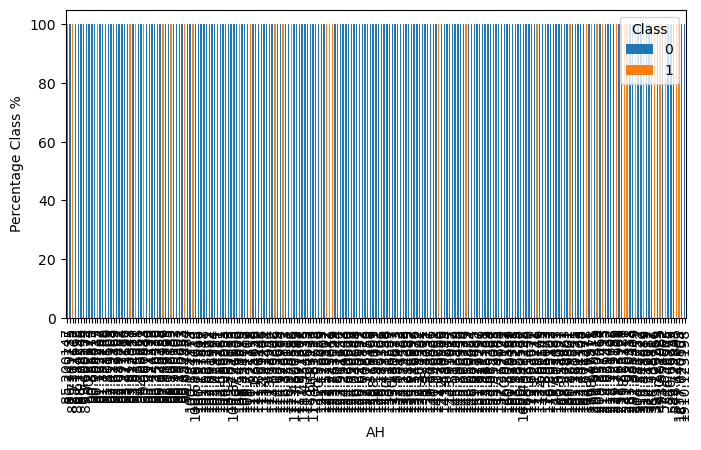

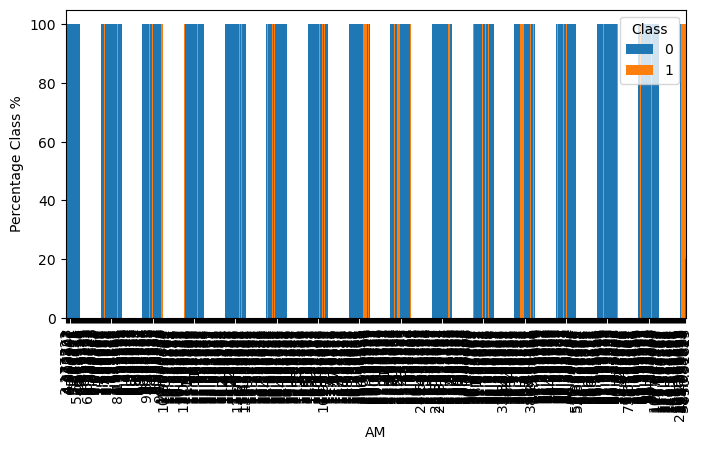

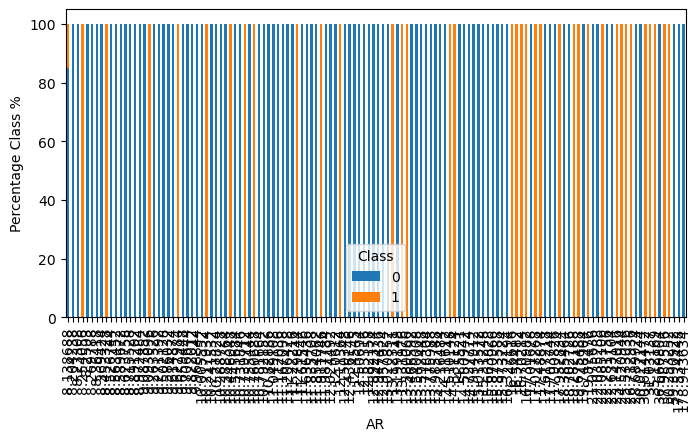

...

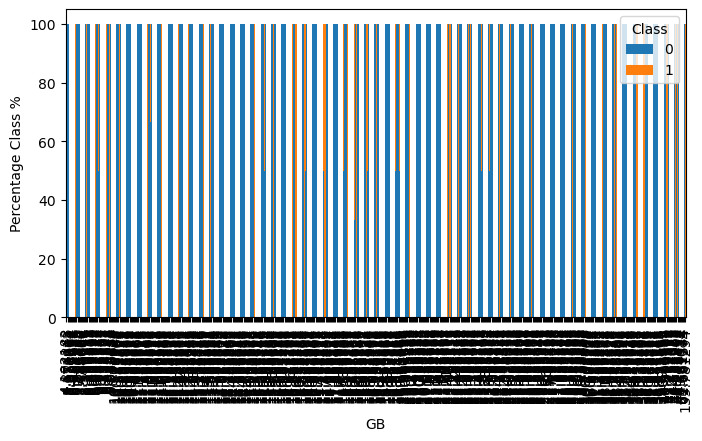

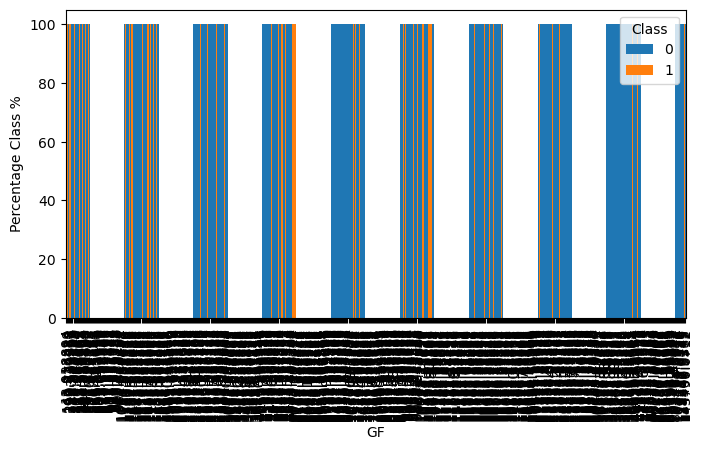

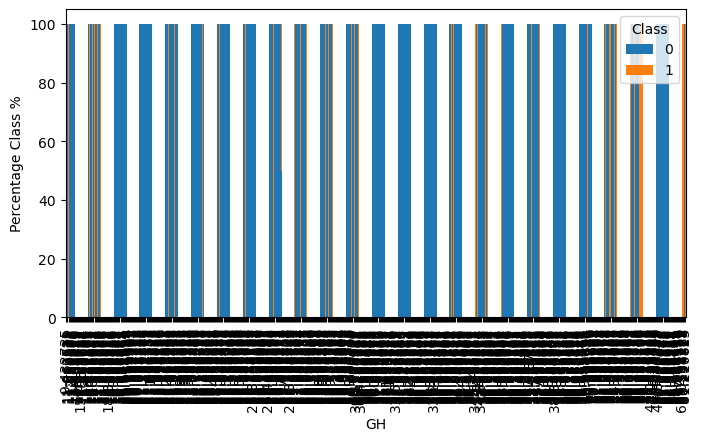

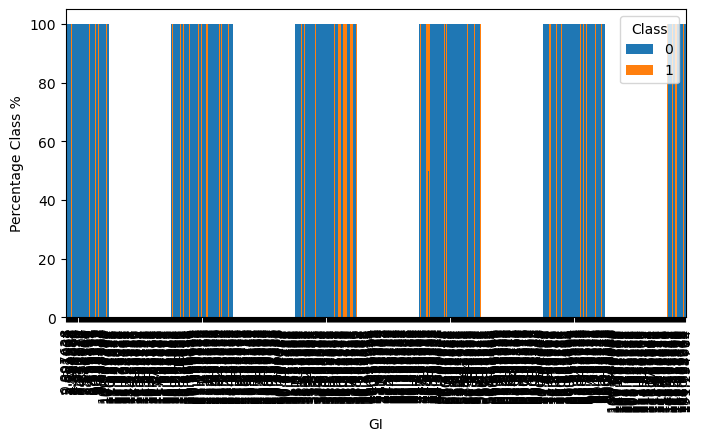

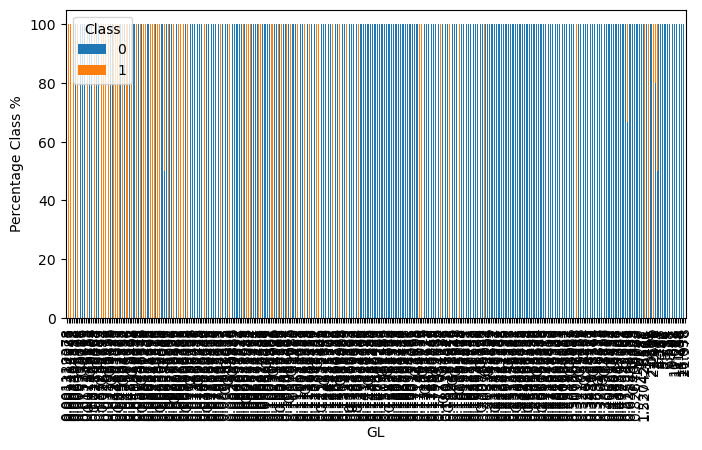

In [19]:
for i in num_cols:
    if i!='Class':
        (pd.crosstab(data[i],data['Class'],normalize='index')*100).plot(kind='bar',figsize=(8,4),stacked=True)
        plt.ylabel('Percentage Class %')

In [20]:
# Mean of numerical variables grouped by Class
data.groupby(['Class'])[num_cols].mean()

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BN,...,FE,FI,FL,FR,FS,GB,GF,GH,GI,GL
Class,,,,,,,,,,,,,,,,,,,,,
0,0.416655,3181.597632,115.997626,31.292888,9.816552,5.430932,0.044508,10.539383,3.377568,21.102061,...,9178.430431,10.238459,4.139887,1.129568,0.420819,20.341573,15821.588253,31.337443,49.300945,9.098095
1,0.762256,5012.120024,131.004931,75.143672,11.597227,6.085887,0.134840,10.693998,30.088202,22.915536,...,15624.825329,9.510742,11.516557,14.865456,0.424737,22.531253,9297.425370,32.207374,56.633487,5.863328


In [21]:
data.groupby(['Class'])[num_cols].mean().T

Class,0,1
AB,0.416655,0.762256
AF,3181.597632,5012.120024
AH,115.997626,131.004931
AM,31.292888,75.143672
AR,9.816552,11.597227
AX,5.430932,6.085887
AY,0.044508,0.134840
AZ,10.539383,10.693998
BC,3.377568,30.088202
BN,21.102061,22.915536


Observations:

Varaible GF has the highest mean of 14679.6

Varaible AY has the lowest mean of 0.060320

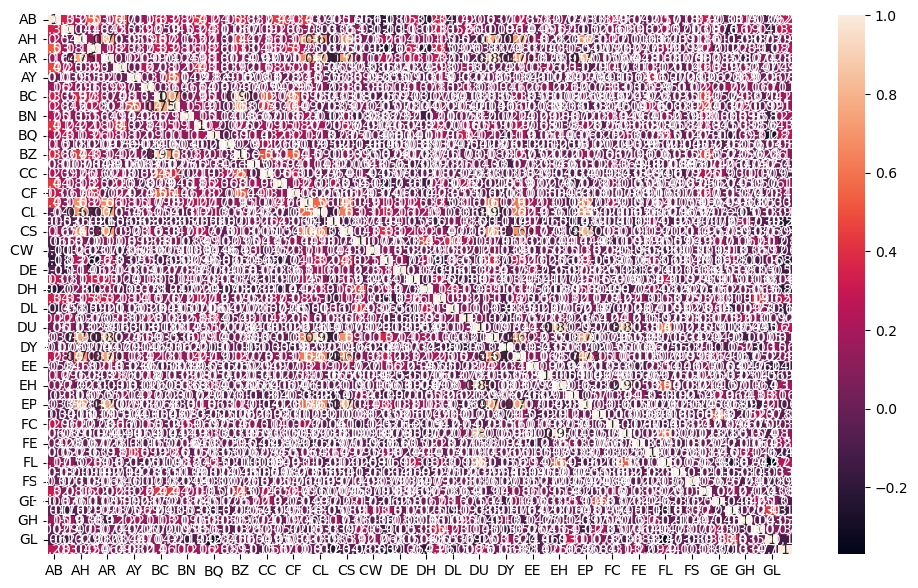

In [22]:
plt.figure(figsize=(12, 7))
sns.heatmap(data.corr(), annot = True, vmax = 1)
plt.show()

It is difficult to read and visualise because the health characterastics are much

In [23]:
Q1 = data.quantile(0.25)  # To find the 25th percentile and 75th percentile.
Q3 = data.quantile(0.75)

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

lower = (Q1 - 1.5 * IQR)  # Finding lower and upper bounds for all values. All values outside these bounds are outliers
upper = Q3 + 1.5 * IQR

In [24]:
(
    (data.select_dtypes(include=["float64", "int64"]) < lower)
    | (data.select_dtypes(include=["float64", "int64"]) > upper)
).sum() / len(data) * 100

AB        5.672609
AF        3.079417
AH       11.345219
AM        8.752026
AR       21.555916
AX        4.376013
AY       17.341977
AZ        2.269044
BC        7.293355
BD        2.431118
BN        2.269044
BP        5.348460
BQ        7.779579
BR        7.617504
BZ       18.800648
CB        7.617504
CC        4.051864
CD        5.996759
CF        6.158833
CH        4.862237
CL       11.993517
CR        5.024311
CS        5.024311
CU        3.403566
CW        0.000000
DA        3.079417
DE        6.158833
DF       22.204214
DH        3.079417
DI        5.672609
DL        2.593193
DN        2.431118
DU       13.614263
DV        6.158833
DY        4.700162
EB        3.403566
EE        3.727715
EG        3.403566
EH        8.427877
EL        0.000000
EP        7.293355
EU        6.158833
FC       11.831442
FD        7.131280
FE        8.914100
FI        7.131280
FL        5.672609
FR        2.431118
FS        4.051864
GB        1.782820
GE       12.803890
GF        6.969206
GH        1.

Model Building

Data preparation.

Partition the data into a train and test set.

Build a model on the train data.

Tune the model if required.

Test the data on the test set.

Data preparation

Creating dummy variables for categorical Variables

In [25]:
data.isna().sum()

Id        0
AB        0
AF        0
AH        0
AM        0
AR        0
AX        0
AY        0
AZ        0
BC        0
BD        0
BN        0
BP        0
BQ       60
BR        0
BZ        0
CB        2
CC        3
CD        0
CF        0
CH        0
CL        0
CR        0
CS        0
CU        0
CW        0
DA        0
DE        0
DF        0
DH        0
DI        0
DL        0
DN        0
DU        1
DV        0
DY        0
EB        0
EE        0
EG        0
EH        0
EL       60
EP        0
EU        0
FC        1
FD        0
FE        0
FI        0
FL        1
FR        0
FS        2
GB        0
GE        0
GF        0
GH        0
GI        0
GL        1
Class     0
dtype: int64

In [26]:
X = data.drop(["Class"], axis=1)
y = data["Class"]

In [27]:
X = pd.get_dummies(X, drop_first=True) # Encoding the Categorical features

In [28]:
data["Class"] = data["Class"].apply(lambda x: 1 if x == "diagnised with one of the three conditions" else 0)

In [29]:
X_train_scale,X_test_scale,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=1,stratify=y)

Scaling the data

The independent variables in this dataset have different scales. When features have different scales from each other, there is a chance that a higher weightage will be given to features that have a higher magnitude, and they will dominate over other features whose magnitude changes may be smaller but whose percentage changes may be just as significant or even larger. This will impact the performance of our machine learning algorithm, and we do not want our algorithm to be biased towards one feature.

The solution to this issue is Feature Scaling, i.e. scaling the dataset so as to give every transformed variable a comparable scale.

Tree based models such as Decision Trees and Random Forest does not require feature scaling to be performed as they are not sensitive to the variance in the data.

We will scale the data for Logistic Regression and SVM. We will use the Standard Scaler method, which centers and scales the dataset using the Z-Score. It standardizes features by subtracting the mean and scaling it to have unit variance. The standard score of sample x is calculated as:

z = (x - u) / s

where u is the mean of the training samples (zero) and s is the standard deviation of the training samples.

In [30]:
# Scaling the data
sc=StandardScaler()

# Fit_transform on train data
X_train_scale=sc.fit_transform(X_train_scale)
X_train_scale=pd.DataFrame(X_train_scale, columns=X.columns)

# Transform on test data
X_test_scale=sc.transform(X_test_scale)
X_test_scale=pd.DataFrame(X_test_scale, columns=X.columns)

In [31]:
print("Shape of Training set : ", X_train_scale.shape)
print("Shape of test set : ", X_test_scale.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (431, 671)
Shape of test set :  (186, 671)
Percentage of classes in training set:
0    0.825986
1    0.174014
Name: Class, dtype: float64
Percentage of classes in test set:
0    0.822581
1    0.177419
Name: Class, dtype: float64


In [32]:
# To impute missing values
from sklearn.impute import SimpleImputer
# Columns to impute
reqd_col_for_impute = ["BQ","CB","CC","DU","EL","FC","FL","FS","GL"]
# Simple Imputer with Mode
imputer = SimpleImputer(strategy="most_frequent")

# Fit and transform the train data
X_train_scale[reqd_col_for_impute] = imputer.fit_transform(X_train_scale[reqd_col_for_impute])

# Transform the test data
X_test_scale[reqd_col_for_impute] = imputer.transform(X_test_scale[reqd_col_for_impute])

In [33]:
# Checking that no column has missing values in train or test sets
print(X_train_scale.isna().sum())
print("-" * 50)
print(X_test_scale.isna().sum())

AB                 0
AF                 0
AH                 0
AM                 0
AR                 0
                  ..
Id_fd3dafe738fd    0
Id_fd895603f071    0
Id_fd8ef6377f76    0
Id_fe1942975e40    0
Id_ffcca4ded3bb    0
Length: 671, dtype: int64
--------------------------------------------------
AB                 0
AF                 0
AH                 0
AM                 0
AR                 0
                  ..
Id_fd3dafe738fd    0
Id_fd895603f071    0
Id_fd8ef6377f76    0
Id_fe1942975e40    0
Id_ffcca4ded3bb    0
Length: 671, dtype: int64


In [34]:
cols = X_train_scale.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train_scale[i].value_counts())
    print("*" * 30)

In [35]:
cols = X_test_scale.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_test_scale[i].value_counts())
    print("*" * 30)

In [36]:
X_train_scale = pd.get_dummies(X_train_scale, drop_first=True)
X_test_scale = pd.get_dummies(X_test_scale, drop_first=True)
print(X_train_scale.shape, X_test_scale.shape)

(431, 671) (186, 671)


After encoding there are 671 columns.

In [37]:
X_train_scale.head()

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,Id_fb786fb02a65,Id_fbb79ba9d642,Id_fbc241daef00,Id_fbd12c4ae88b,Id_fd1dd68d51b4,Id_fd3dafe738fd,Id_fd895603f071,Id_fd8ef6377f76,Id_fe1942975e40,Id_ffcca4ded3bb
0,-0.513677,-0.560608,0.874056,-0.402521,-0.189150,-0.318837,-0.081991,1.203828,-0.113403,0.176174,...,-0.048224,-0.048224,-0.048224,0.0,0.0,-0.048224,-0.048224,-0.048224,-0.048224,-0.048224
1,-0.197268,-0.183061,-0.263017,0.507840,0.101811,0.761782,-0.081991,-1.744336,-0.113403,-0.402788,...,-0.048224,-0.048224,-0.048224,0.0,0.0,-0.048224,-0.048224,-0.048224,-0.048224,-0.048224
2,-0.322166,-0.897734,-0.263017,-0.456876,-0.189150,-0.968494,-0.081991,1.154156,-0.045440,-0.095044,...,-0.048224,-0.048224,-0.048224,0.0,0.0,-0.048224,-0.048224,-0.048224,-0.048224,-0.048224
3,0.127468,-0.104219,-0.263017,0.632865,-0.189150,2.784725,-0.081991,0.245455,-0.113403,-0.148410,...,-0.048224,-0.048224,-0.048224,0.0,0.0,-0.048224,-0.048224,-0.048224,-0.048224,-0.048224
4,-0.567800,-0.088619,-0.235437,-0.367792,-0.189150,-0.577735,0.074299,-0.030661,-0.026552,-0.129673,...,-0.048224,-0.048224,-0.048224,0.0,0.0,-0.048224,-0.048224,-0.048224,-0.048224,-0.048224


Model evaluation criterion

The model can make two types of wrong predictions:

Predicting an employee will attrite when the employee doesn't attrite Predicting an employee will not attrite when the employee actually attrites Which case is more important?

Predicting that the employee will not attrite but the employee attrites, i.e., losing out on a valuable employee or asset. This would be considered a major miss for any employee attrition predictor and hence the more important case of wrong predictions. How to reduce this loss i.e the need to reduce False Negatives?

The company would want the Recall to be maximized, the greater the Recall, the higher the chances of minimizing false negatives. Hence, the focus should be on increasing the Recall (minimizing the false negatives) or, in other words, identifying the true positives (i.e. Class 1) very well, so that the company can provide incentives to control the attrition rate especially, for top-performers. This would help in optimizing the overall project cost towards retaining the best talent. Also, let's create a function to calculate and print the classification report and confusion matrix so that we don't have to rewrite the same code repeatedly for each model.

In [38]:
# Creating metric function 
def metrics_score(actual, predicted):
    print(classification_report(actual, predicted))

    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize=(8,5))
    
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels=['Not diagnosed with one of the three age related conditions', 'diagnosed with one of the three age related conditions'], yticklabels=['Not diagnosed with one of the three conditions ', 'diagnosed with one of the three conditions'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

In [39]:
# Creating metric function 
def metrics_score(actual, predicted):
    print(classification_report(actual, predicted))

    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize=(8,5))
    
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels=['Not diagnosed with one of the three age related conditions', 'diagnosed with one of the three age related conditions'], yticklabels=['Not diagnosed with one of the three conditions ', 'diagnosed with one of the three conditions'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

In [40]:
# Fitting logistic regression model
lg=LogisticRegression()
lg.fit(X_train_scale,y_train)

LogisticRegression()

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       356
           1       1.00      1.00      1.00        75

    accuracy                           1.00       431
   macro avg       1.00      1.00      1.00       431
weighted avg       1.00      1.00      1.00       431



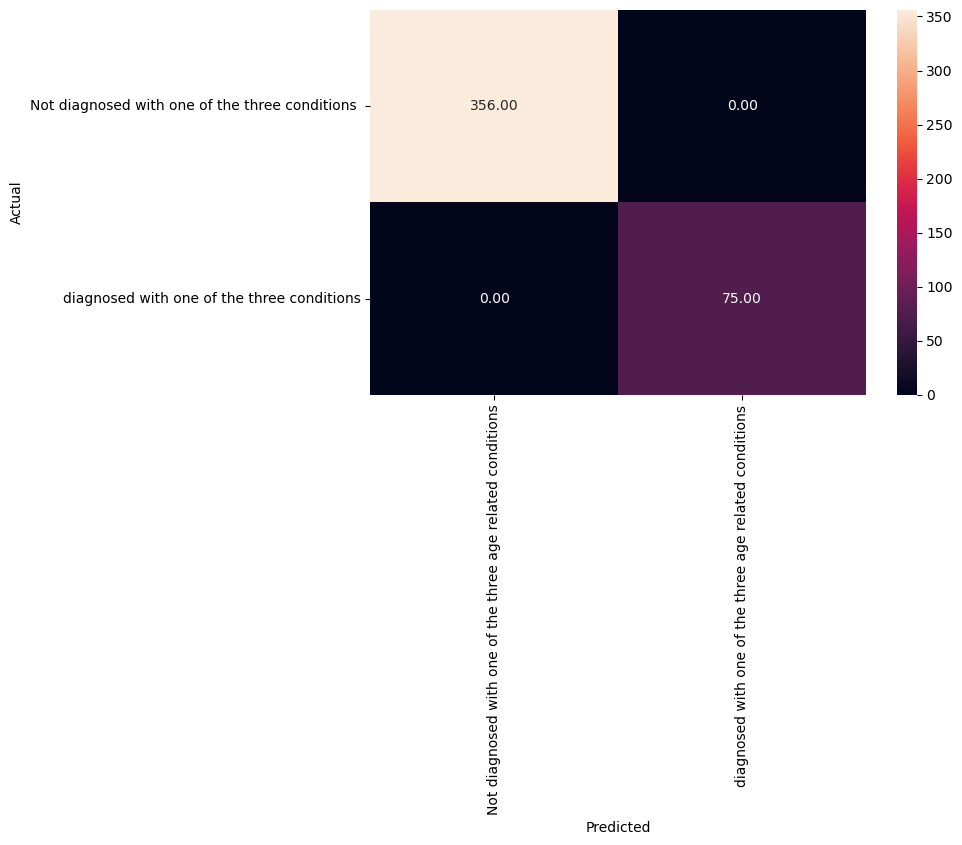

In [41]:
# Checking the performance on the training data
y_pred_train = lg.predict(X_train_scale)

metrics_score(y_train, y_pred_train)

The reported average includes the macro average which averages the unweighted mean per label, and the weighted average i.e. averaging the support-weighted mean per label. In classification, the class of interest is considered the positive class. Here, the class of interest is 1 i.e. identifying the diagnosed with one of the three age related conditions.

Reading the confusion matrix (clockwise):

True Negative (Actual=0, Predicted=0): Model predicts that an subject is not diagnosed with one of the three age related conditionsand and the subject is not diagnosed with one of the three age related conditions

False Positive (Actual=0, Predicted=1): Model predicts that an subject is diagnosed with one of the three age related conditions but the subject is not diagnosed with one of the three age related conditions

False Negative (Actual=1, Predicted=0): Model predicts that an subject is not diagnosed with one of the three age related conditions but the subject is diagnosed with one of the three age related conditions

True Positive (Actual=1, Predicted=1): Model predicts that an subject is diagnosed with one of the three age related conditions and the subject is actually diagnosed with one of the three age related conditions

              precision    recall  f1-score   support

           0       0.85      1.00      0.92       153
           1       1.00      0.15      0.26        33

    accuracy                           0.85       186
   macro avg       0.92      0.58      0.59       186
weighted avg       0.87      0.85      0.80       186



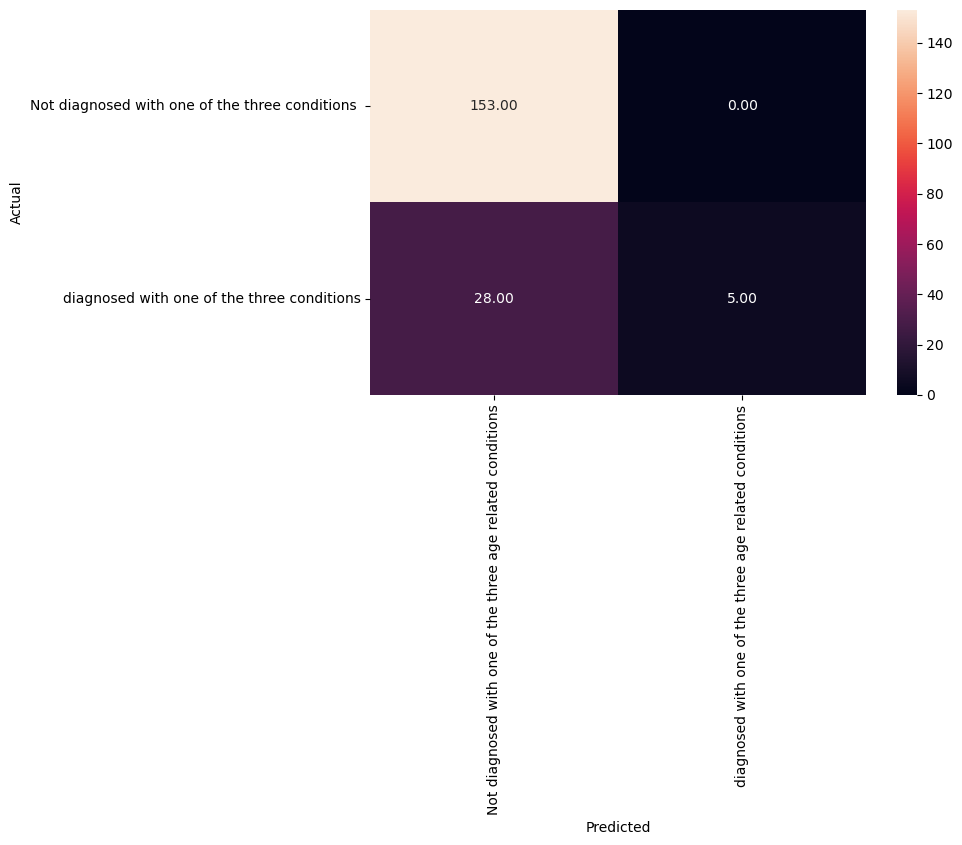

In [42]:
# Checking the performance on the test dataset
y_pred_test = lg.predict(X_test_scale)

metrics_score(y_test, y_pred_test)

Observations:

We are getting an accuracy of around 100% on train and 85% on test dataset. However, the recall for this model is around 100% and 15% for class 1 on train and on test. As the recall is very low on the test data, this model will perform well in differentiating out those subjects who have a high chance of been diagnosed with one of the three age related conditions, meaning it will eventually help in the diagnoses with one of the three age related conditions. As we can see from the Confusion Matrix, this model is able to identify the majority of subjects who are at risk of been diagnosed with one of the three age related conditions.

Let's check the coefficients and find which variables(subjects or health characterastics) are leading to been diagnose with one of the three age related conditions and which can help to reduce the three age related conditions

Observations:

We are getting an accuracy of around 56% on train and 58% on test dataset. However, the recall for this model is around 80% for class 1 on train and 85% on test. As the recall is good, this model will perform well in differentiating out those subjects who have a high chance of been diagnosed with one of the three age related conditions, meaning it will eventually help in the diagnoses with one of the three age related conditions. As we can see from the Confusion Matrix, this model is able to identify the majority of subjects who are at risk of been diagnosed with one of the three age related conditions.

In [43]:
# Printing the coefficients of logistic regression

cols=X_train_scale.columns

coef_lg=lg.coef_

pd.DataFrame(coef_lg,columns=cols).T.sort_values(by=0,ascending=False)

,0
Id_cf5439add02c,0.461900
Id_7cb9a95a62fc,0.429777
DU,0.424984
Id_68729b79859b,0.422126
Id_5fe47095520d,0.414830
...,...
DL,-0.324190
CS,-0.357616
DH,-0.360781
FI,-0.437683


In [44]:
# Printing the coefficients of logistic regression

cols=X_train_scale.columns

coef_lg=lg.coef_

pd.DataFrame(coef_lg,columns=cols).T.sort_values(by=0,ascending=False)

,0
Id_cf5439add02c,0.461900
Id_7cb9a95a62fc,0.429777
DU,0.424984
Id_68729b79859b,0.422126
Id_5fe47095520d,0.414830
...,...
DL,-0.324190
CS,-0.357616
DH,-0.360781
FI,-0.437683


The coefficients of the logistic regression model give us the log of odds, which is hard to interpret in the real world. We can convert the log of odds into real odds by taking its exponential.

In [45]:
# Finding the odds
odds = np.exp(lg.coef_[0])

# Adding the odds to a dataframe and sorting the values
pd.DataFrame(odds, X_train_scale.columns, columns=['odds']).sort_values(by='odds', ascending=False) 

,odds
Id_cf5439add02c,1.587086
Id_7cb9a95a62fc,1.536914
DU,1.529566
Id_68729b79859b,1.525201
Id_5fe47095520d,1.514114
...,...
DL,0.723113
CS,0.699342
DH,0.697132
FI,0.645530


Observations

The odds of an subject BC to be diagnosed with one these conditions are 1.000358 times the odds of one who is not, probably due to the fact that BC is not sustainable for an extended duration for any Ssubject, and may lead to sign and symptons and been diagnosed with one of the conditions. The odds of an subjects FD,AM,FR and DI are double the odds of subjects which are not diagnosed with one of these conditions.

Precision-Recall Curve for logistic regression

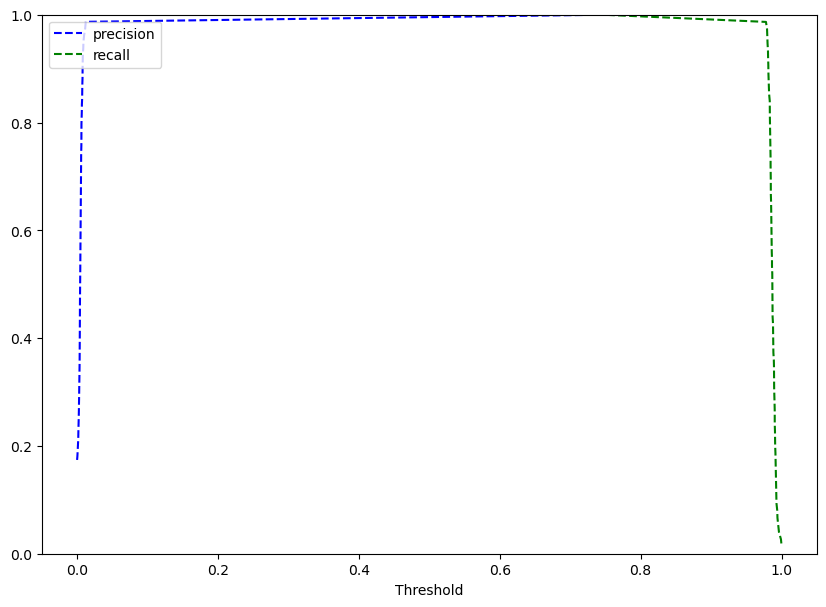

In [46]:
# Predict_proba gives the probability of each observation belonging to each class
y_scores_lg=lg.predict_proba(X_train_scale)

precisions_lg, recalls_lg, thresholds_lg = precision_recall_curve(y_train, y_scores_lg[:,1])

# Plot values of precisions, recalls, and thresholds
plt.figure(figsize=(10,7))
plt.plot(thresholds_lg, precisions_lg[:-1], 'b--', label='precision')
plt.plot(thresholds_lg, recalls_lg[:-1], 'g--', label = 'recall')
plt.xlabel('Threshold')
plt.legend(loc='upper left')
plt.ylim([0,1])
plt.show()

Observation:

We can see that precision and recall are balanced for a threshold of about ~1.0

Let's find out the performance of the model at this threshold

              precision    recall  f1-score   support

           0       0.83      1.00      0.90       356
           1       0.00      0.00      0.00        75

    accuracy                           0.83       431
   macro avg       0.41      0.50      0.45       431
weighted avg       0.68      0.83      0.75       431



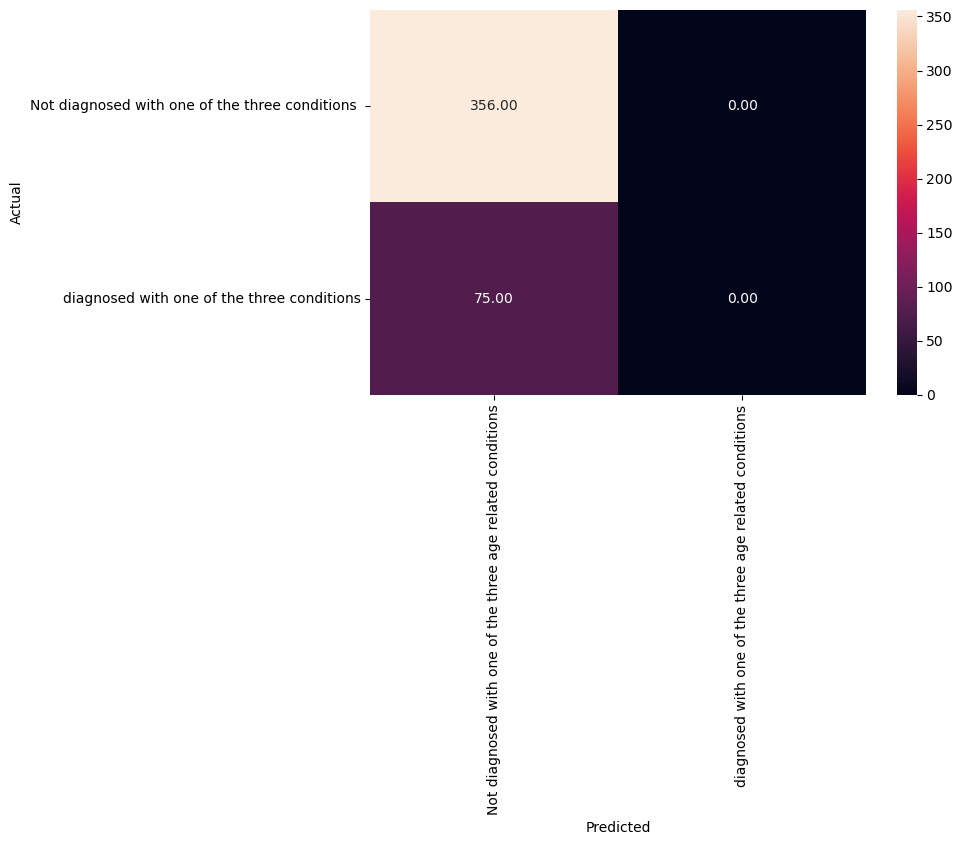

In [47]:
optimal_threshold=1.0
y_pred_train = lg.predict_proba(X_train_scale)

metrics_score(y_train, y_pred_train[:,1]>optimal_threshold)

Observations

The model performance has improved. The recall has increased significantly for class 1.

              precision    recall  f1-score   support

           0       0.82      1.00      0.90       153
           1       0.00      0.00      0.00        33

    accuracy                           0.82       186
   macro avg       0.41      0.50      0.45       186
weighted avg       0.68      0.82      0.74       186



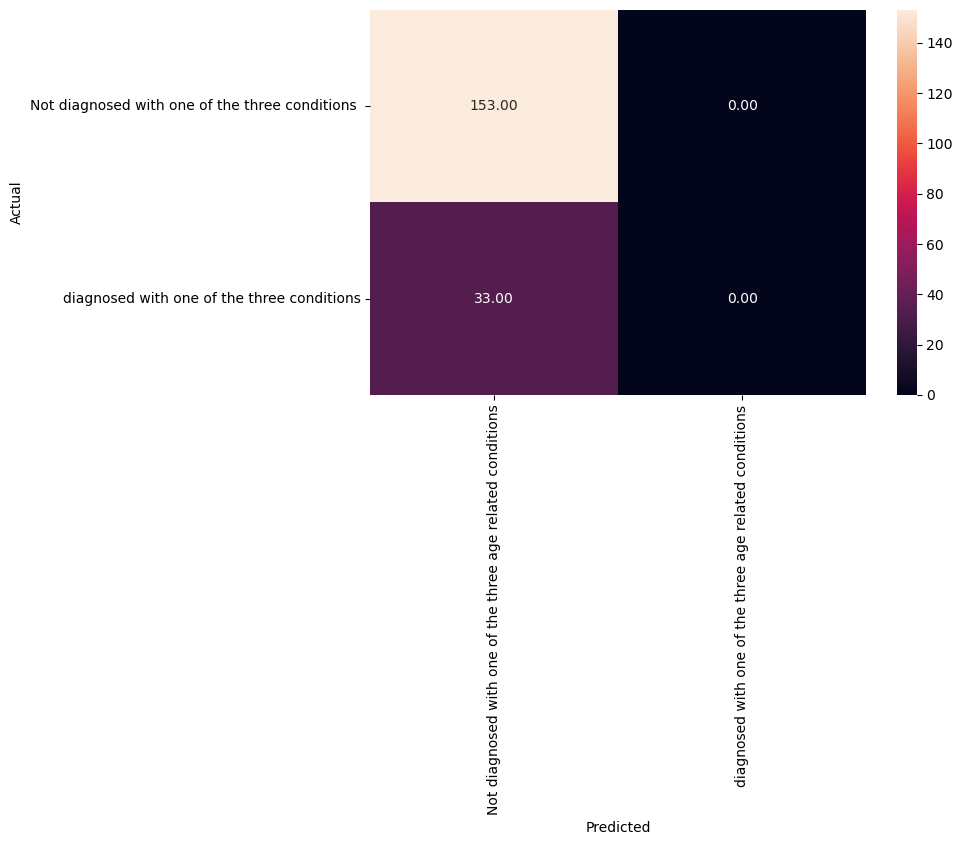

In [48]:
optimal_threshold=1.0
y_pred_test = lg.predict_proba(X_test_scale)

metrics_score(y_test, y_pred_test[:,1]>optimal_threshold)

Observation:

The model has 82% accuracy on the train and test data i.e. the model is giving a generalized performance.

The recall of the test data has decreased significantly while at the same time, the precision has increased, which is to be expected while adjusting the threshold.

The average recall and precision for the model are good but let's see if we can get better performance using other algorithms.

Support Vector Machines Let's build the models using the two of the widely used kernel functions:

1.Linear Kernel

2.RBF Kernel

Linear Kernel

In [49]:
# Fitting SVM
svm = SVC(kernel='linear') # Linear kernal or linear decision boundary
model = svm.fit(X= X_train_scale, y = y_train)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       356
           1       1.00      1.00      1.00        75

    accuracy                           1.00       431
   macro avg       1.00      1.00      1.00       431
weighted avg       1.00      1.00      1.00       431



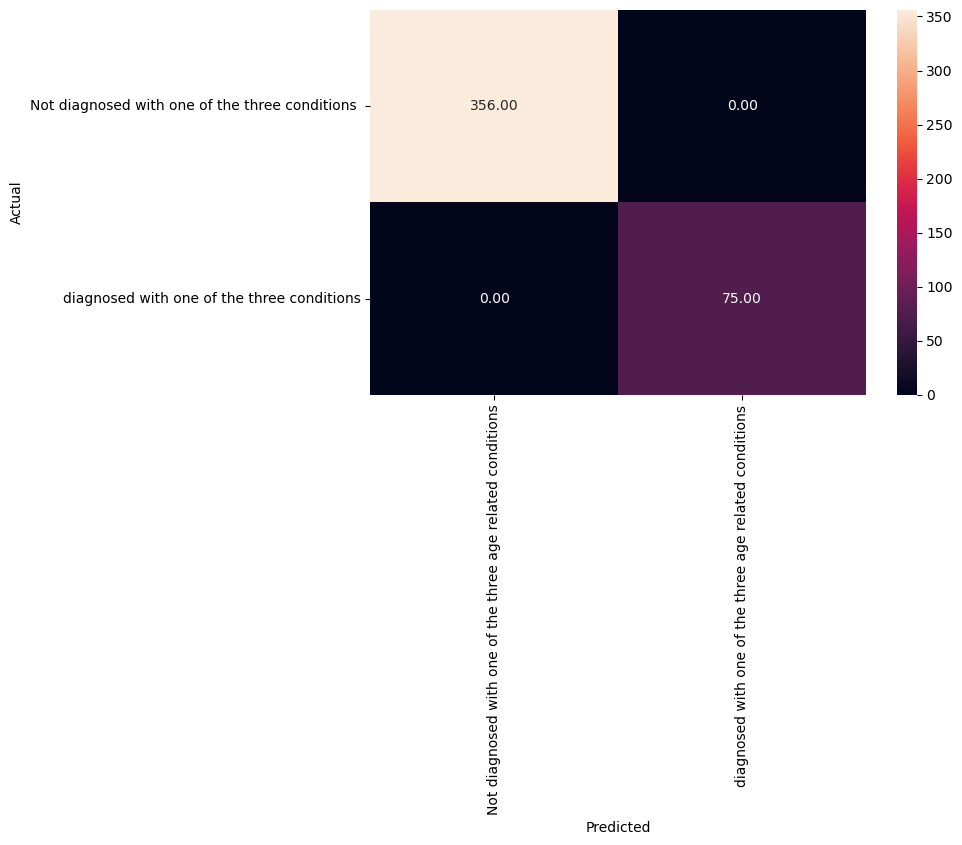

In [50]:
y_pred_train_svm = model.predict(X_train_scale)

metrics_score(y_train, y_pred_train_svm)

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       153
           1       0.78      0.55      0.64        33

    accuracy                           0.89       186
   macro avg       0.85      0.76      0.79       186
weighted avg       0.89      0.89      0.88       186



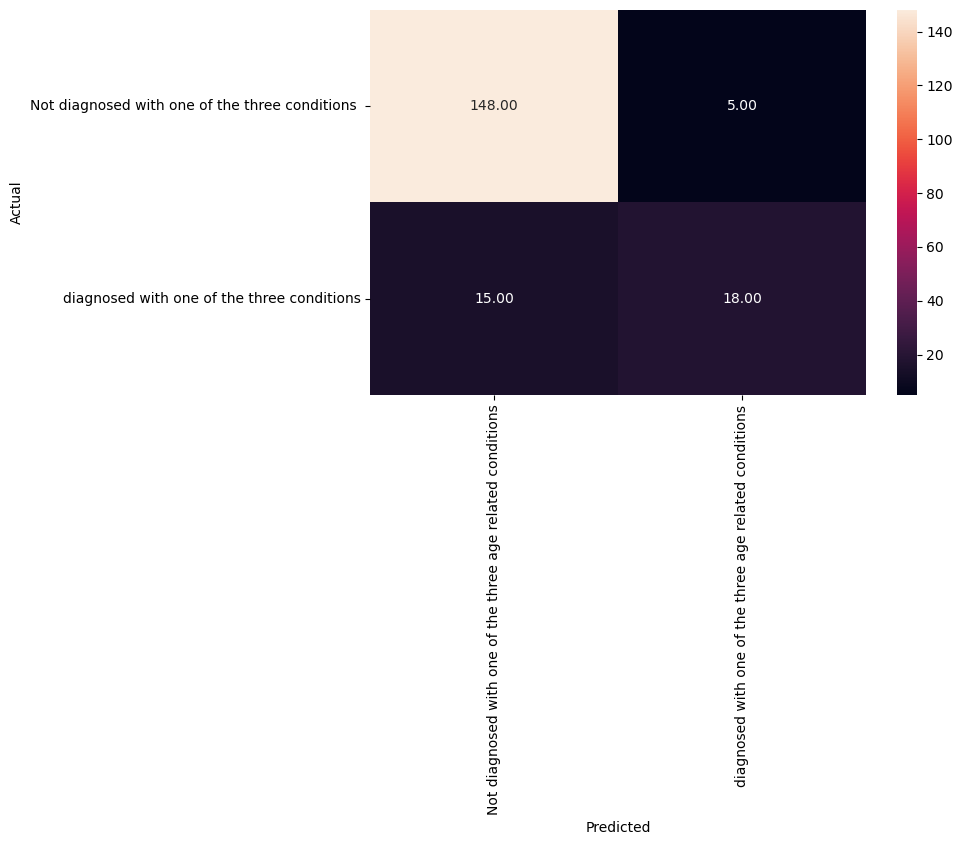

In [51]:
# Checking performance on the test data
y_pred_test_svm = model.predict(X_test_scale)

metrics_score(y_test, y_pred_test_svm)

SVM model with linear kernel is not overfitting as the accuracy is around 90% for both train and test dataset

The Recall for the model is around 55% implying that our model will not correctly predict the employees who are at risk of attrition

RBF Kernel

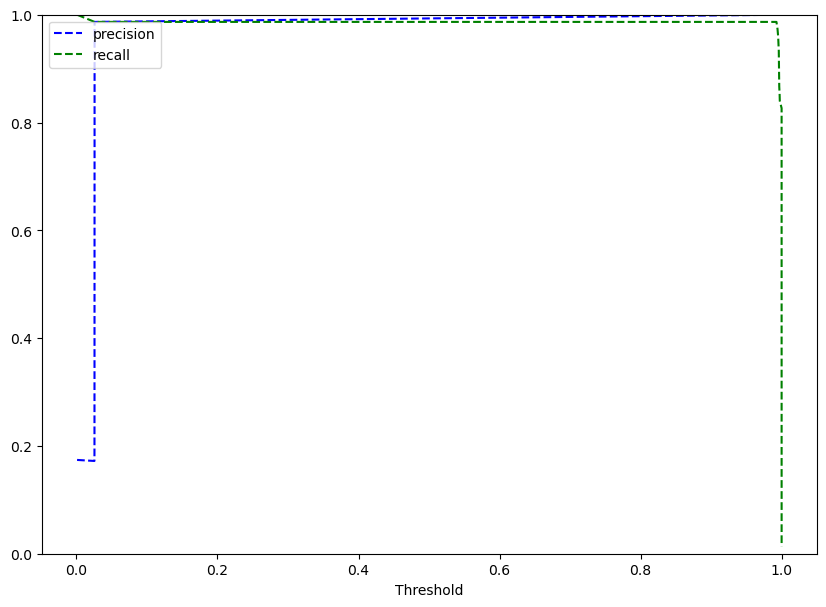

In [52]:
svm_rbf=SVC(kernel='rbf',probability=True)
# Fit the model
svm_rbf.fit(X_train_scale,y_train)
# Predict on train data
y_scores_svm=svm_rbf.predict_proba(X_train_scale)

precisions_svm, recalls_svm, thresholds_svm = precision_recall_curve(y_train, y_scores_svm[:,1])

# Plot values of precisions, recalls, and thresholds
plt.figure(figsize=(10,7))
plt.plot(thresholds_svm, precisions_svm[:-1], 'b--', label='precision')
plt.plot(thresholds_svm, recalls_svm[:-1], 'g--', label = 'recall')
plt.xlabel('Threshold')
plt.legend(loc='upper left')
plt.ylim([0,1])
plt.show()

The threshold can be estimated to approximately 1.0

              precision    recall  f1-score   support

           0       0.83      1.00      0.90       356
           1       0.00      0.00      0.00        75

    accuracy                           0.83       431
   macro avg       0.41      0.50      0.45       431
weighted avg       0.68      0.83      0.75       431



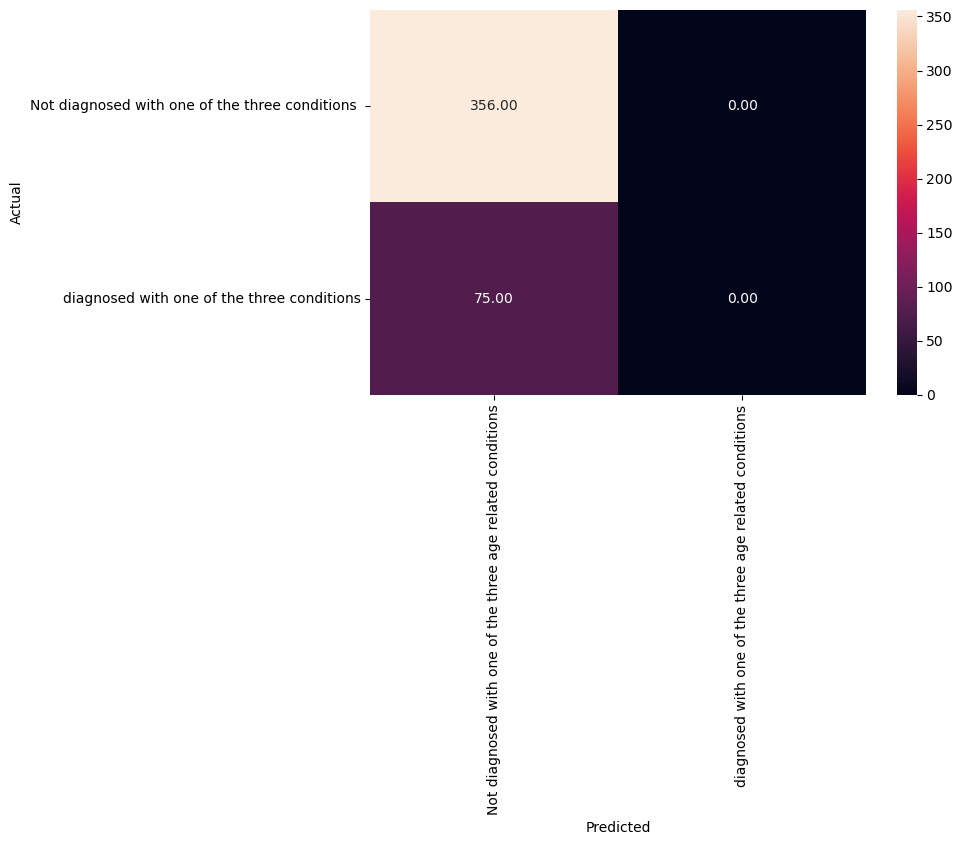

In [53]:
optimal_threshold_svm=1.0
y_pred_train = svm_rbf.predict_proba(X_train_scale)

metrics_score(y_train, y_pred_train[:,1]>optimal_threshold_svm)

              precision    recall  f1-score   support

           0       0.82      1.00      0.90       153
           1       0.00      0.00      0.00        33

    accuracy                           0.82       186
   macro avg       0.41      0.50      0.45       186
weighted avg       0.68      0.82      0.74       186



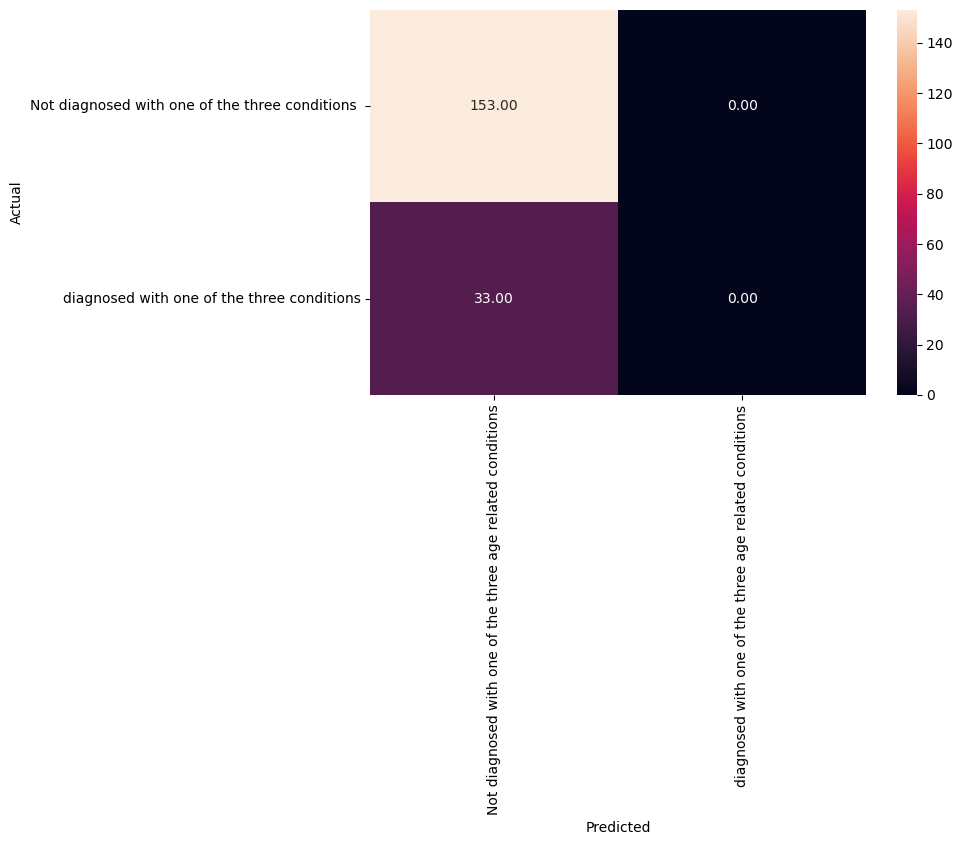

In [54]:
optimal_threshold_svm=1.0
y_pred_test = svm_rbf.predict_proba(X_test_scale)
metrics_score(y_test, y_pred_test[:,1]>optimal_threshold_svm)

At the optimal threshold of 1.0, accuracy is 90% the model performance has improved significantly. The recall is 0 and the model is not giving good generalized results. Moreover, the kernel used is rbf, so the model performs well with a non-linear kernel. As the recall is high, this model will perform well in differentiating out those employees who have a high chance of leaving the company, meaning it will eventually help in reducing the attrition rate.

Decision Tree We will build our model using the DecisionTreeClassifier function. If the frequency of class A is 17% and the frequency of class B is 83%, then class B will become the dominant class and the decision tree will become biased toward the dominant class. class_weight is a hyperparameter for the decision tree classifier, and in this case, we can pass a dictionary {0:0.17, 1:0.83} to the model to specify the weight of each class and the decision tree will give more weightage to class 1.

**Let us test for the Not Linearly Separable - Kernel Trick**

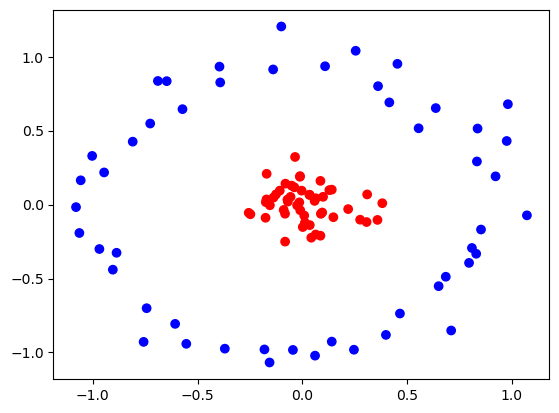

In [55]:
# creating the data points and visualizing it
from sklearn.datasets import make_circles
X, y = make_circles(100, factor=.1, noise=.1)  # X contains the X and Y co-ordinates of the data points
                                               # y contains the labels for each data points

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='bwr')

In [56]:
def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out


# function to plot decision boundary 
def plot_decision_boundary(X,y,ker ='linear'):
  svm = SVC(kernel='linear') # Linear kernal or linear decision boundary
  model = svm.fit(X= X_train_scale, y = y_train)
  clf = model.fit(X, y)
  fig, ax = plt.subplots()
  # title for the plots
  title = (F"Decision surface by {ker} Kernel ")
  # Set-up grid for plotting.
  X0, X1 = X[:, 0], X[:, 1]
  xx, yy = make_meshgrid(X0, X1)
  plot_contours(ax, clf, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
  ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
  ax.set_ylabel('y')
  ax.set_xlabel('x')
  ax.set_xticks(())
  ax.set_yticks(())
  ax.set_title(title)
  plt.show()

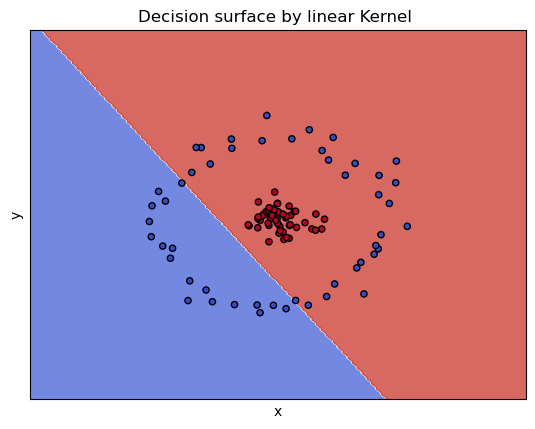

In [57]:
#using linear kernel
plot_decision_boundary(X,y,'linear')

We are fitting linear classifier to non-linear data. So it's not classifying the data points correctly as expected.

The blue datapoints are identified along with red since the data is non-linear.

In [58]:
#function for 3d representation of our data
def plot_3d(X, y):
    r = np.exp(-(X ** 2).sum(1)) # r is the corresponding z-axis value for each data point
    axes = plt.subplot(projection='3d')
    axes.scatter3D(X[:, 0], X[:, 1], r, c=y, s=100, cmap='bwr')
    axes.set_xlabel('X1')
    axes.set_ylabel('X2')
    axes.set_zlabel('y')
    return axes

<Axes3D: xlabel='X1', ylabel='X2', zlabel='y'>

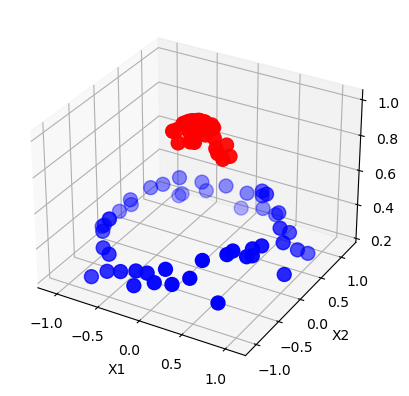

In [59]:
plot_3d(X, y)

The 3d view is giving a better view of the classifyer.


We will now see how using a non-linear kernel will change the decision boundary


Refer to this document to know more about RBF Kernel: https://towardsdatascience.com/radial-basis-function-rbf-kernel-the-go-to-kernel-acf0d22c798a

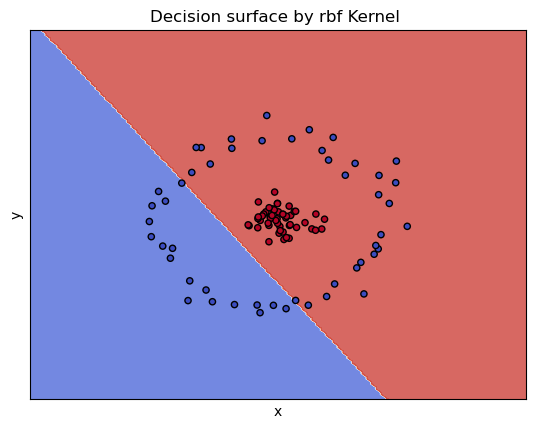

In [60]:
#using rbf kernel
plot_decision_boundary(X,y,'rbf')

We will now see how using a non-linear kernel will change the decision boundary

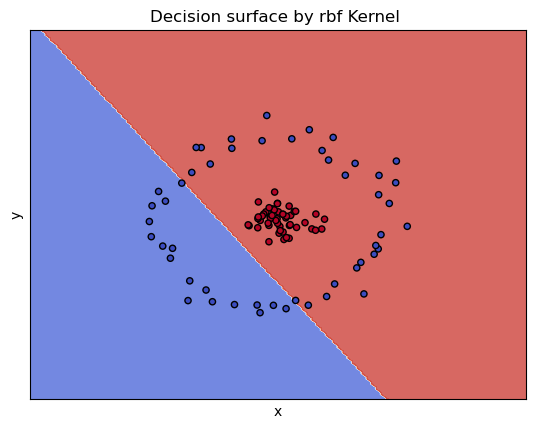

In [61]:
#using rbf kernel
plot_decision_boundary(X,y,'rbf')

The non-linear kernel has not change the decision boundary


Building decision tree model

In [62]:
data = DecisionTreeClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1, max_depth = 8)

In [63]:
# Fitting decision tree model
data.fit(X_train_scale, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=8,
                       random_state=1)

Let's check the model performance of decision tree

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       356
           1       1.00      1.00      1.00        75

    accuracy                           1.00       431
   macro avg       1.00      1.00      1.00       431
weighted avg       1.00      1.00      1.00       431



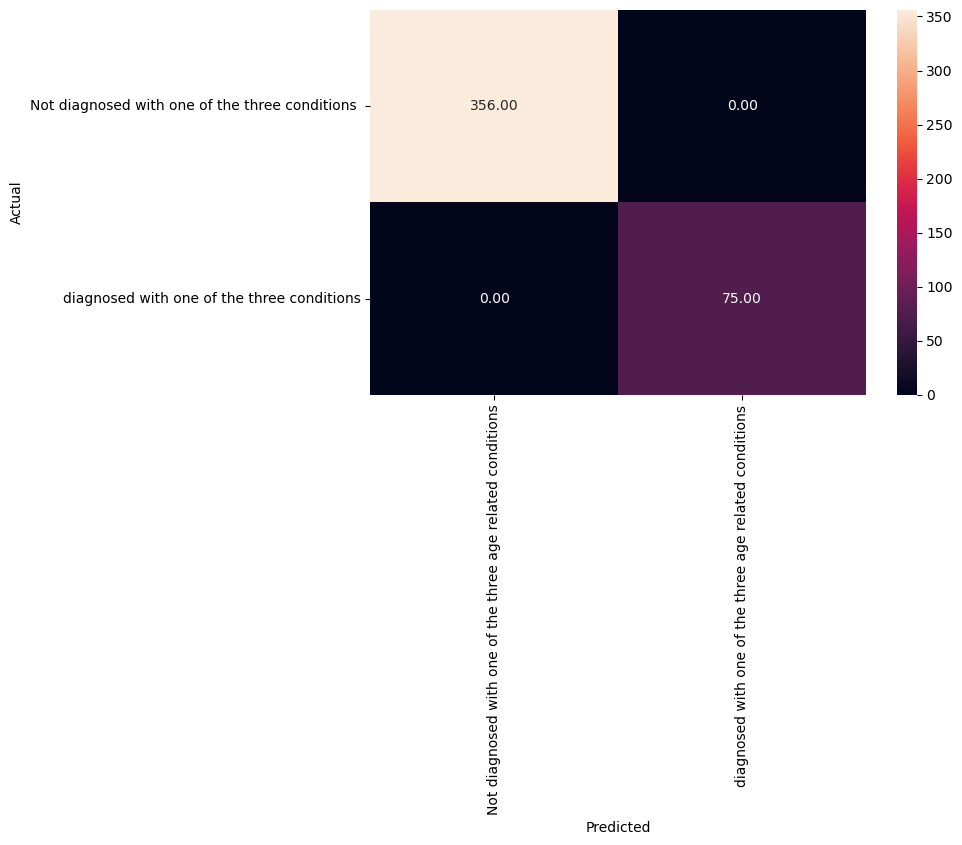

In [64]:
# Checking performance on the training dataset
y_train_pred_data = data.predict(X_train_scale)

metrics_score(y_train, y_train_pred_data)

Observation:

The Decision tree is giving a 100% score for all metrics on the training dataset.

This seem to be overfitting.

              precision    recall  f1-score   support

           0       0.91      0.95      0.93       153
           1       0.72      0.55      0.62        33

    accuracy                           0.88       186
   macro avg       0.81      0.75      0.78       186
weighted avg       0.87      0.88      0.88       186



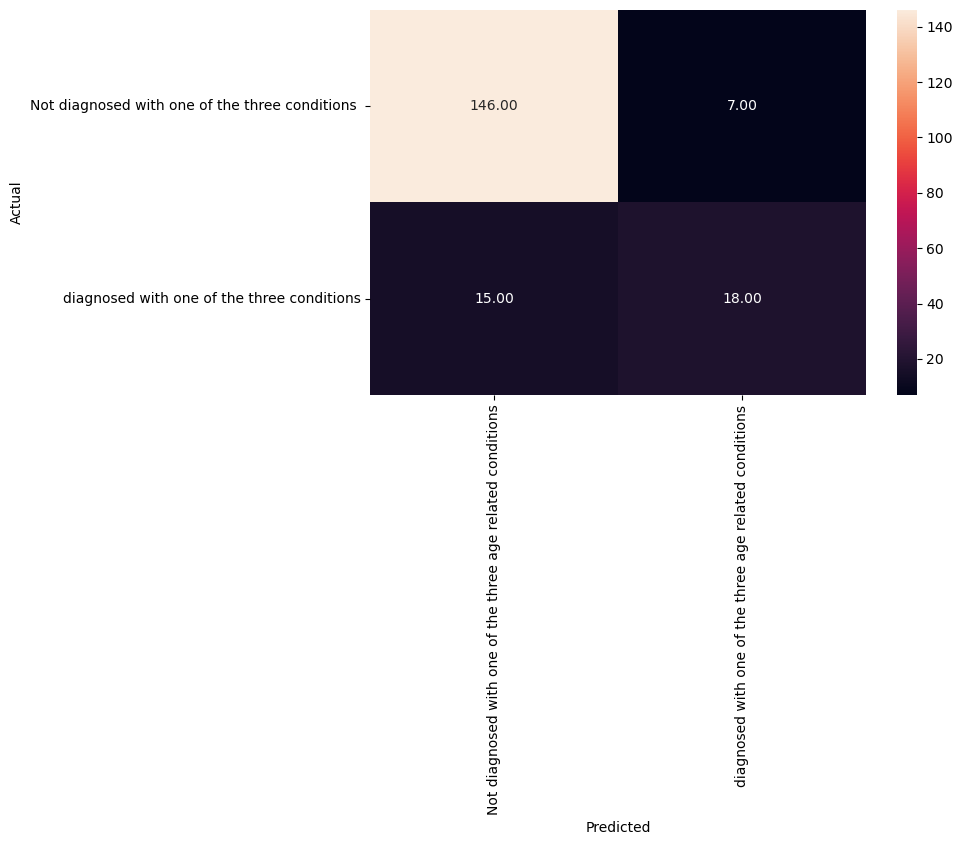

In [65]:
# Checking performance on the test dataset
y_test_pred_data = data.predict(X_test_scale)

metrics_score(y_test, y_test_pred_data)

Observations:

The Decision Tree works well on the training data but not so well on the test data as the recall is 0.80 in comparison to 1 for the training dataset, i.e., the Decision Tree is overfitting the training data. The precision on the test data suggests that there's a 27% (1 - 0.73) chance that the model will predict that a person is going to leave even though he/she would not, and the company may waste their time and energy on these employees who are not at risk of attrition.

Let's plot the feature importance and check the most important features.

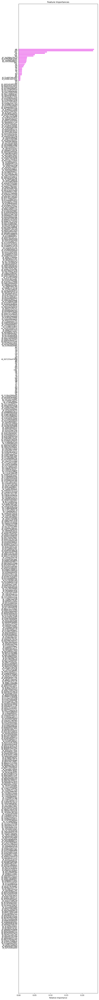

In [66]:
# Importance of features in the tree building

feature_names = list(X_train_scale.columns)
importances = data.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 100))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

Observations:

Their are 25 health characterastics that can lead to a subject been diagnosed positive to the age related conditions,
they are listed sequentially according to their relative importance as been obtained from the impotance features bar chart above:

1.AB

2.DU

3.FD

4.EE

5.CD

6.BC

7.Id-3a288ec2811f

8.Ida795db8ca395

9.Id7cbqaq5a62fc

10.Id-cf543add02c

11.BD

12.AF

13.DA

14.AX

15.FE

16.CC

17.EP

18.EP

19.FI

20.EH

21.GF

22.BR

23.Id-f1a68746ca6e

24.Id-d3d8c9d232f1

25.DA

This might signify that subjects who are at risk of been diagnose psitive with one of the three age related conditions have these health characterastics eailier, but attention,care and or trearment was given to them.

Let's plot the tree and check:

As we know the decision tree keeps growing until the nodes are homogeneous, i.e., it has only one class, and the dataset here has a lot of features, it would be hard to visualize the whole tree with so many features. Therefore, we are only visualizing the tree up to max_depth = 4.

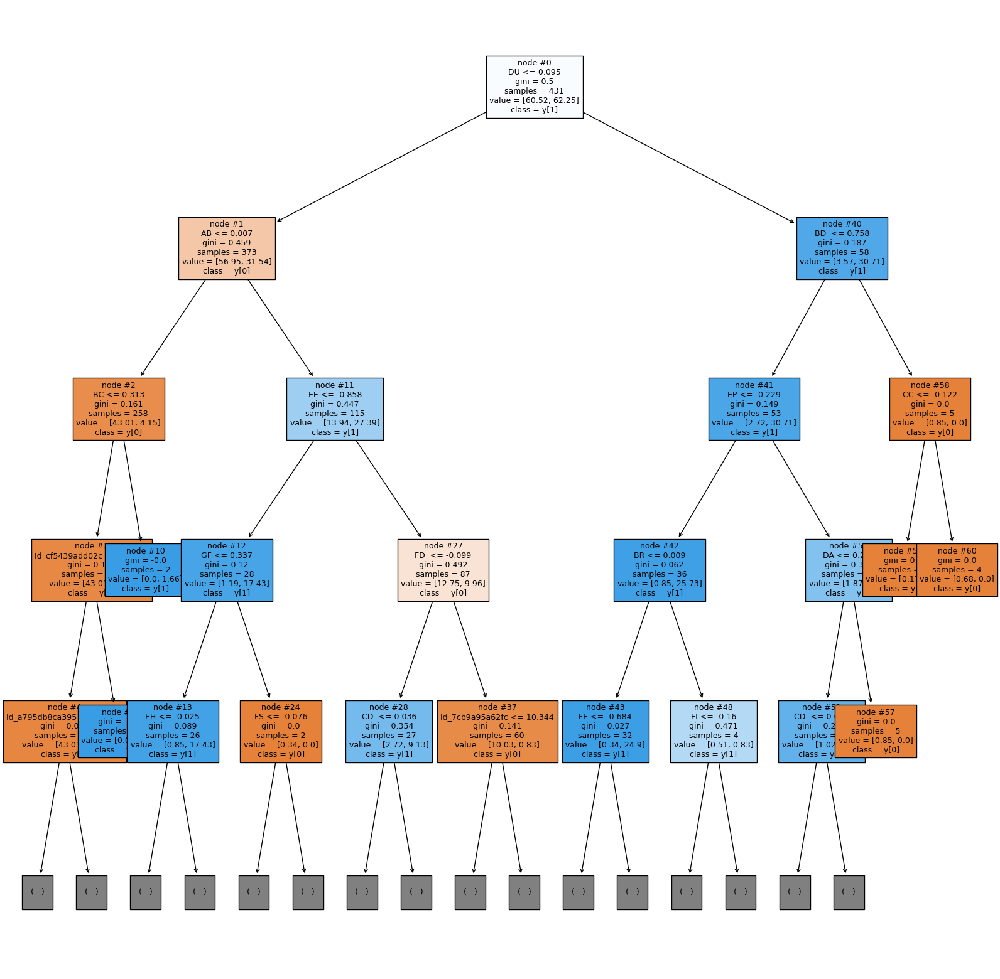

In [67]:
features = list(X_train_scale.columns)

plt.figure(figsize = (20, 20))
from sklearn import tree
tree.plot_tree(data,feature_names=features,max_depth = 4,filled = True, fontsize = 9, node_ids = True, class_names = True)

plt.show()

Note: Blue leaves represent the attrition, i.e., y[1] and the orange leaves represent the non-attrition, i.e., y[0]. Also, the more the number of observations in a leaf, the darker its color gets

Random Forest

Random Forest is a bagging algorithm where the base models are Decision Trees. Samples are taken from the training data and on each sample, a decision tree makes a prediction. The results from all the decision trees are combined and the final prediction is made using voting (for classification problems)or averaging (for regression problems).

In [68]:
# Fitting the Random Forest classifier on the training data
rf_estimator = RandomForestClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

rf_estimator.fit(X_train_scale, y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       356
           1       1.00      1.00      1.00        75

    accuracy                           1.00       431
   macro avg       1.00      1.00      1.00       431
weighted avg       1.00      1.00      1.00       431



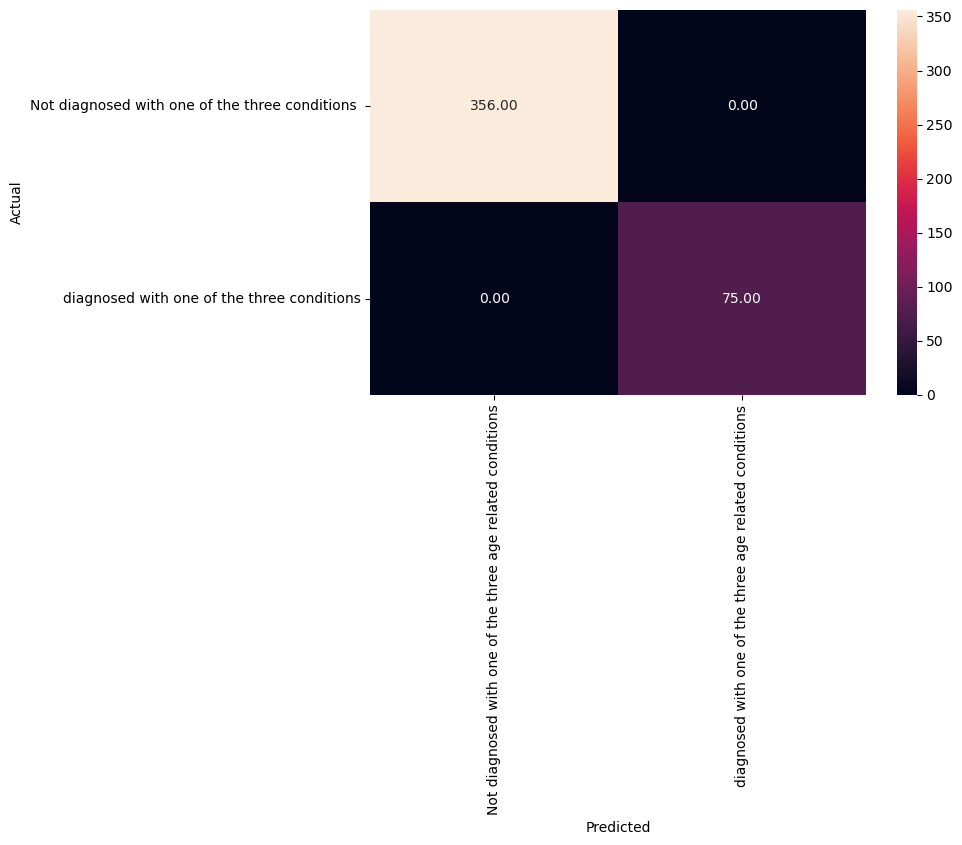

In [69]:
# Checking performance on the training data
y_pred_train_rf = rf_estimator.predict(X_train_scale)

metrics_score(y_train, y_pred_train_rf)

Observation:

For all the metrics in the training dataset, the Random Forest gives a 100% score
This is overfitting

              precision    recall  f1-score   support

           0       0.85      1.00      0.92       153
           1       1.00      0.15      0.26        33

    accuracy                           0.85       186
   macro avg       0.92      0.58      0.59       186
weighted avg       0.87      0.85      0.80       186



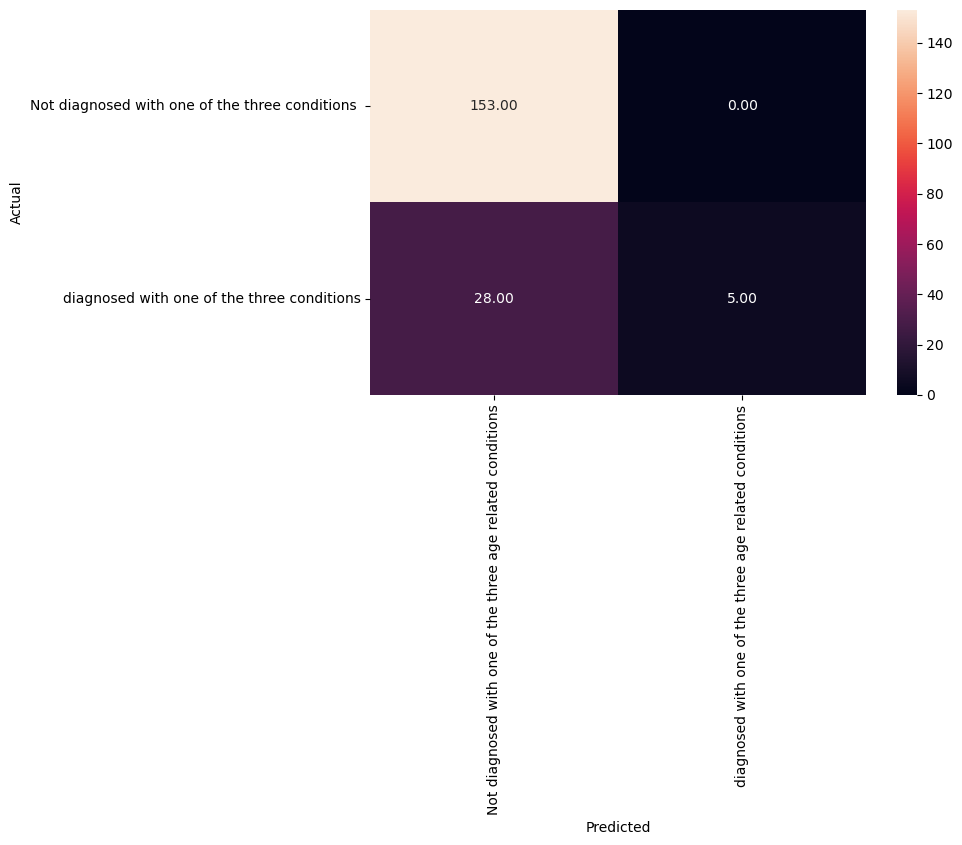

In [70]:
# Checking performance on the testing data
y_pred_test_rf = rf_estimator.predict(X_test_scale)

metrics_score(y_test, y_pred_test_rf)

Observations:

The Random Forest classifier seems to be overfitting the training data.

The recall on the training data is 1, precission is 1, accuracy is 1, while the recall on the test data is only ~ 15%,

precission is 1(still) and accuracy is 85% for class 1.

Precision is high for the test data as well.

Let's check the feature importance of the Random Forest

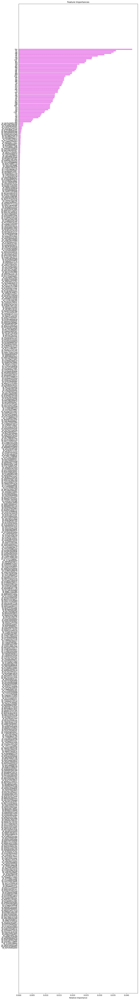

In [71]:

# Importance of features in the tree building
importances = rf_estimator.feature_importances_

columns = X_train_scale.columns
indices = np.argsort(importances)
plt.figure(figsize=(12, 100))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()


From the above random forest features of importance we saw that DU,FL,AB,AE,AE,DI,DA

are the most health characterastics that would lead the subject been diagnosed as positive

to the three age related conditions.

Their are 53 health characterastics that can lead to a subject been diagnosed positive to the age related conditions
,
they are listed sequentially according to their relative importance as been obtained from the impotance features bar chart above:

DU,FL,AB,AE,DA,DI,FD,BC,EH,CR,EE,BO,FR,GE,DE,BN.DH,CD,BP,CC,EB,BR,GJ,AZ,EU,CU,DY,AM,FI,GH,EL,AX,CB,CE,DF,CH,EG,DN,GB,BD,CS,FS,EP

GE,CW,FC,CL,AR,AY,DV,AH,BZ, then floowed the Id numbers from Id-667b389f278d to Id34f10f630b68


In [72]:
# Choose the type of classifier
datatree_estimator = DecisionTreeClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2, 7), 
              'criterion': ['gini', 'entropy'],
              'min_samples_leaf': [5, 10, 20, 25]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(recall_score, pos_label = 1)

# Run the grid search
gridCV = GridSearchCV(datatree_estimator, parameters, scoring = scorer, cv = 10)

# Fitting the grid search on the train data
gridCV = gridCV.fit(X_train_scale, y_train)

# Set the classifier to the best combination of parameters
datatree_estimator = gridCV.best_estimator_

# Fit the best estimator to the data
datatree_estimator.fit(X_train_scale, y_train)
DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=2,
                       min_samples_leaf=5, random_state=1)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=2,
                       min_samples_leaf=5, random_state=1)

              precision    recall  f1-score   support

           0       0.98      0.71      0.82       356
           1       0.40      0.93      0.56        75

    accuracy                           0.75       431
   macro avg       0.69      0.82      0.69       431
weighted avg       0.88      0.75      0.78       431



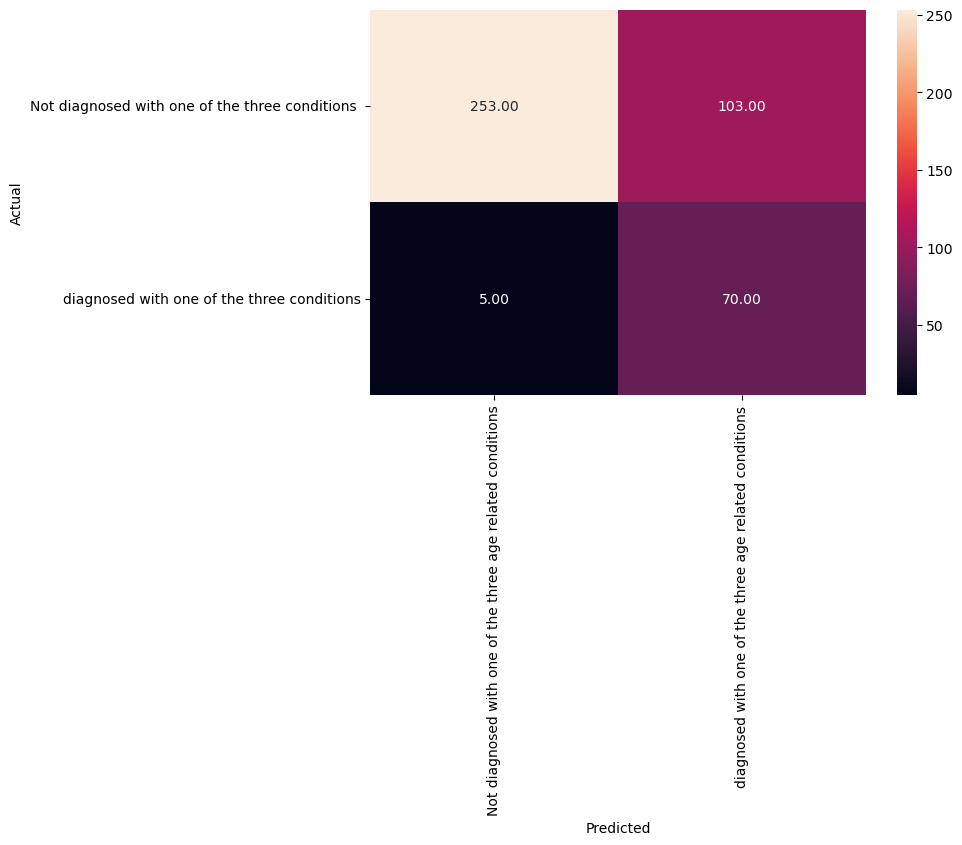

In [73]:
# Checking performance on the training dataset
y_train_pred_data = datatree_estimator.predict(X_train_scale)

metrics_score(y_train, y_train_pred_data)


This good, you can see that the model is not overfitting

              precision    recall  f1-score   support

           0       0.97      0.73      0.83       153
           1       0.41      0.88      0.56        33

    accuracy                           0.76       186
   macro avg       0.69      0.81      0.70       186
weighted avg       0.87      0.76      0.78       186



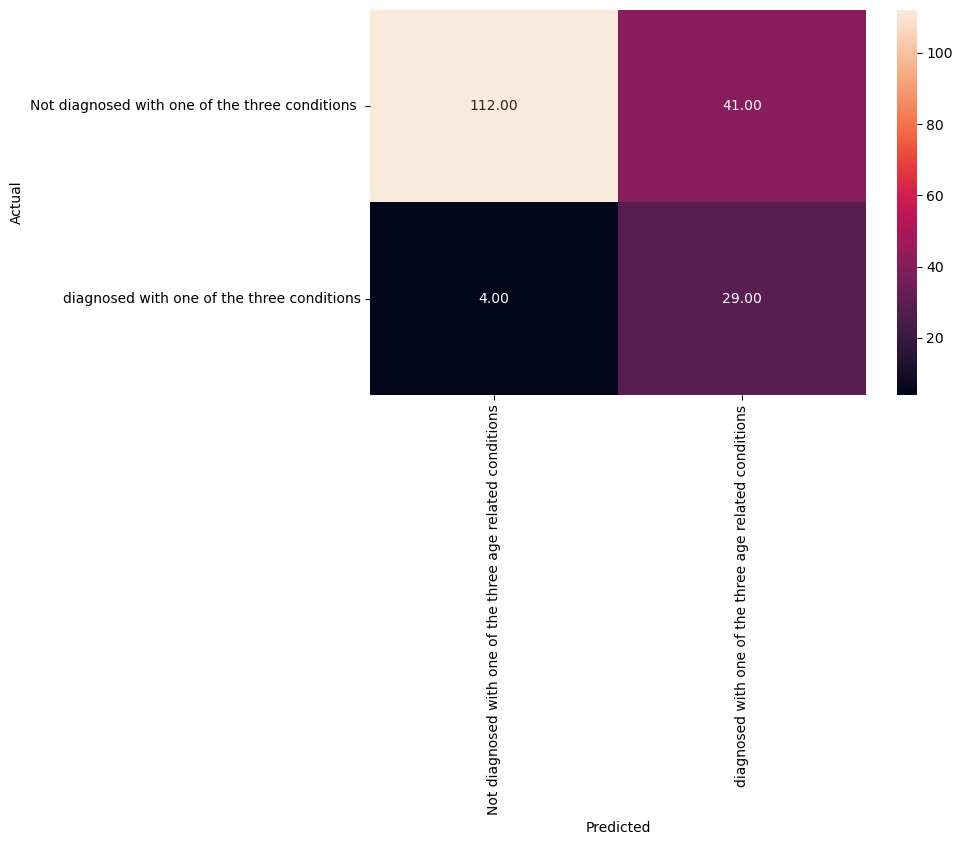

In [74]:
# Checking performance on the test dataset
y_test_pred_data = datatree_estimator.predict(X_test_scale)

metrics_score(y_test, y_test_pred_data)


Observations:

The tuned model is not performing well in comparison to the model with default values of hyperparameters.

This model is not overfitting the training data and gives almost the same result on the test and train datasets

when considering precission and accuracy.

Recall has gone down from 93% to 75% in comparison to the previous model which means the tuned model is good, i.e is going produce True Positive, this model will predict the subject been diagnose with one of these age related conditions and it will be so.

Let's look at the feature importance of this model and try to analyze why this is happening.

Text(0.5, 0, 'Relative Importance')

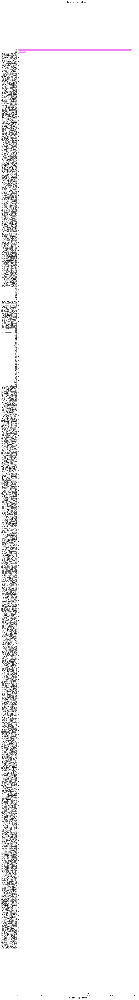

In [75]:
# Importance of features in the tree building
importances = datatree_estimator.feature_importances_

columns = X_train_scale.columns
indices = np.argsort(importances)
plt.figure(figsize=(12, 100))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")

Observations:
AB,DU & EP are the most three health charactrastics that are related to age conditions

Observations:

After tuning the model, we found out that only 3 features are important. It seems like the model is having high bias, as it has over-simplified the problem and is not capturing the patterns associated with other variables. According to this model too, OverTime, TotalWorkingYears, and MonthlyIncome are the 3 most important features that describe why an employee is leaving the organization, which might imply that employees doing overtime may feel that their remuneration is not enough for their efforts.

Random Forest Please refer to the sklearn link to learn more about the parameters and values that the algorithm can take https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html.

Here are some of the parameters,

n_estimators: The number of trees in the forest.

min_samples_split: The minimum number of samples required to split an internal node.

min_samples_leaf: The minimum number of samples required to be at a leaf node.

max_features{“auto”, “sqrt”, “log2”, 'None'}: The number of features to consider when looking for the best split.

If “auto”, then max_features=sqrt(n_features).

If “sqrt”, then max_features=sqrt(n_features) (same as “auto”).

If “log2”, then max_features=log2(n_features).

If None, then max_features=n_features.

In [76]:
# Choose the type of classifier
rf_estimator_tuned = RandomForestClassifier(class_weight = {0: 0.17, 1: 0.83}, random_state = 1,)

# Grid of parameters to choose from
params_rf = {  
        "n_estimators": [100, 250, 500],
        "min_samples_leaf": np.arange(1, 4, 1),
        "max_features": [0.7, 0.9, 'auto'],
}


# Type of scoring used to compare parameter combinations - recall score for class 1
scorer = metrics.make_scorer(recall_score, pos_label = 1)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_tuned, params_rf, scoring = scorer, cv = 5)

grid_obj = grid_obj.fit(X_train_scale, y_train)

# Set the classifier to the best combination of parameters
rf_estimator_tuned = grid_obj.best_estimator_


In [77]:
rf_estimator_tuned.fit(X_train_scale, y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, max_features=0.7,
                       min_samples_leaf=3, n_estimators=500, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       356
           1       1.00      1.00      1.00        75

    accuracy                           1.00       431
   macro avg       1.00      1.00      1.00       431
weighted avg       1.00      1.00      1.00       431



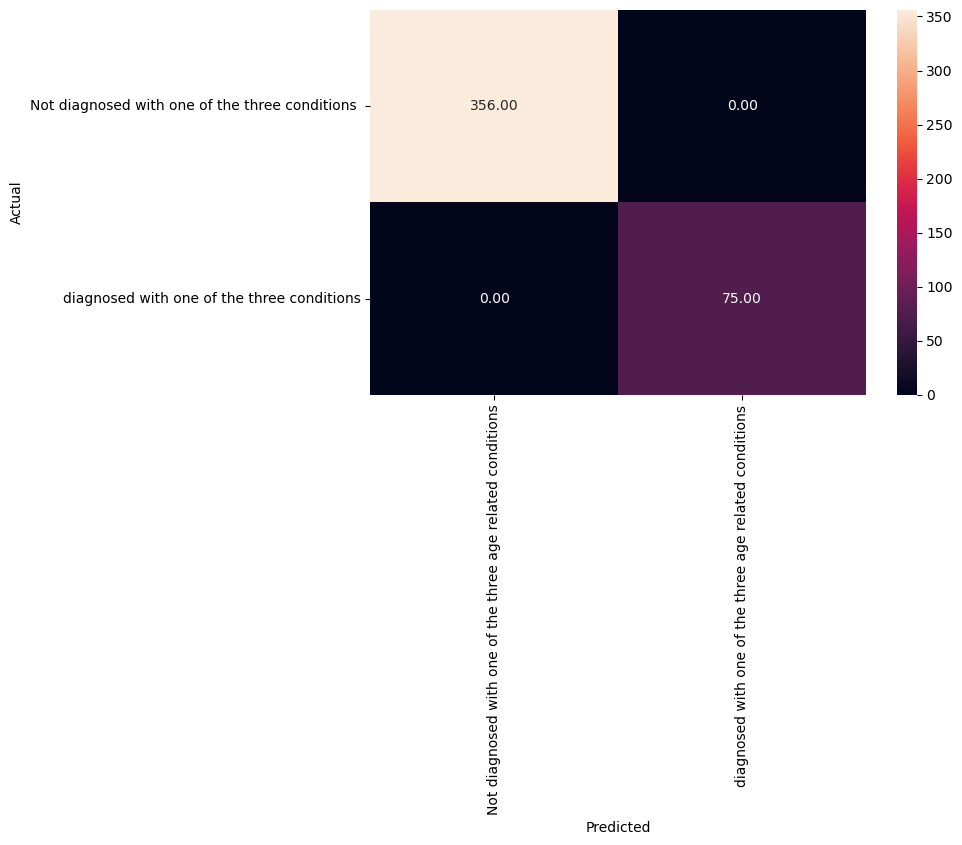

In [78]:
# Checking performance on the training data
y_pred_train_rf_tuned = rf_estimator_tuned.predict(X_train_scale)

metrics_score(y_train, y_pred_train_rf_tuned)

              precision    recall  f1-score   support

           0       0.94      0.97      0.95       153
           1       0.83      0.73      0.77        33

    accuracy                           0.92       186
   macro avg       0.89      0.85      0.86       186
weighted avg       0.92      0.92      0.92       186



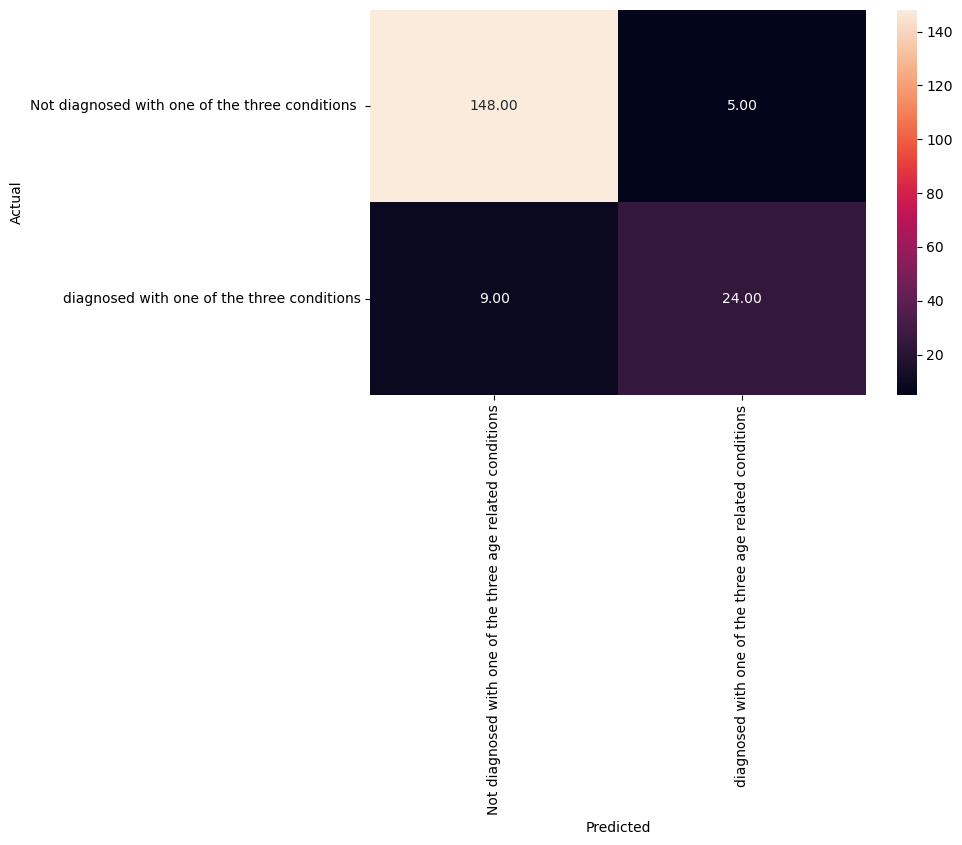

In [79]:
# Checking performance on the test data
y_pred_test_rf_tuned = rf_estimator_tuned.predict(X_test_scale)

metrics_score(y_test, y_pred_test_rf_tuned)

After tuning the model is overfitting the training data as it produced: Precission = 1 Recall = 1 Accuracy = 1

But the test data produced:
Precission =83%
Recall =73%
Accuracy =92%

Thus the tuned model is good and can rely upon.

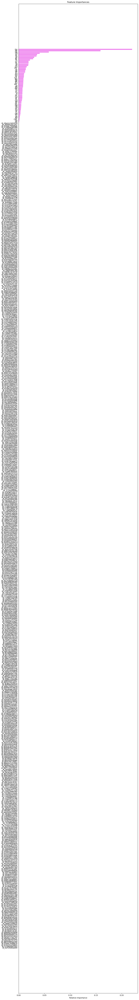

In [80]:
# Plotting feature importance
importances = rf_estimator_tuned.feature_importances_

columns = X_train_scale.columns
indices = np.argsort(importances)
plt.figure(figsize=(12, 100))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
mportance_data = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
plt.show()

The tuned random forest model has given the following health characterastics that are related to age related conditions in a rank and sequential manner

as: DU,AB,CR,EE,GL,AE,BC,FL,CC,DL,DI,FR,DH,FD,FE,DE,EP,EH,GH,DY,CD,BO,EB,BR,FU,BD,GI,BN,AM,FS,CE,CS,FI,DF,CU,GF,EL,CH,BP,AZ,EG,GB,CB,AX,AH,AY,CL,DN,EC,GE,BZ,CW,DV,AR and the followed with identity numbers from Id46a2c24d2624 to Id_60f0f1fe86ad00.

Recommendations:
    
The health characterastics DU,AB appears to be very dominant features that contribute in the age related condtions

The health characterastics DU,AB,A,B,D,FE,R,C,H,G,N,L, appears to be very important characterastics that when combined with 

anyanother characterarstics can lead to the subject been diagnose positive with the age related condtions.


Conculusions:

Handling the above reccomendate health characterastics will translate into helping the aged people to be healthy.